In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import sklearn
from sklearn.manifold import MDS
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import r2_score

## Data Loading and Cleaning

In [16]:
data=pd.read_csv('Zephyr Data Emo with new categories.csv', engine="python", delimiter=';')

In [17]:
data.head(3)

,Time,Year,Month,Weekday,Hour,HR,BR,Posture,Activity,PeakAcceleration,...,JumpFlightTime,PeakAccelPhi,peakAccelTheta,Activities,Activities Detailed,Controled stress,stress,Before Controled stress,After controlled stress,Name of the volunteer
0,26.3.2020 9:02:28,2020,March,Thursday,9,79,15,16,"0,01","0,02",...,0,163,-50,900 trining working 1930 training,sport,1.0,NaN,NaN,NaN,EM
1,26.3.2020 9:02:29,2020,March,Thursday,9,79,15,16,"0,01","0,1",...,0,168,-87,900 trining working 1930 training,sport,1.0,NaN,NaN,NaN,EM
2,26.3.2020 9:02:30,2020,March,Thursday,9,79,15,17,"0,01","0,03",...,0,164,-47,900 trining working 1930 training,sport,1.0,NaN,NaN,NaN,EM


There are only for persons and some activities are overpresented compared to others. 

In [7]:
print(data['Name of the volunteer'].unique())

['EM' 'AB' 'NP' 'VM']


We need to clean the data by handling missing values, strings to floating numbers, standardization or normalization.

In [18]:
#to be run only once
data.fillna(0, inplace=True)
data.set_index('Time', inplace=True)
data.index = pd.to_datetime(data.index, format='%d.%m.%Y %H:%M:%S')

In [19]:
type(data['Activity'].iloc[0])

str

In [20]:
data['Activity'] = data['Activity'].str.replace(',', '.')
data['Activity'] = data['Activity'].astype(float)

data['PeakAcceleration'] = data['PeakAcceleration'].str.replace(',', '.')
data['PeakAcceleration'] = data['PeakAcceleration'].astype(float)

data['ECGAmplitude'] = data['ECGAmplitude'].str.replace(',', '.')
data['ECGAmplitude'] = data['ECGAmplitude'].astype(float)

data['ECGNoise'] = data['ECGNoise'].str.replace(',', '.')
data['ECGNoise'] = data['ECGNoise'].astype(float)

data['CoreTemp'] = data['CoreTemp'].str.replace(',', '.')
data['CoreTemp'] = data['CoreTemp'].astype(float)

data['AvForceDevRate'] = data['AvForceDevRate'].str.replace(',', '.')
data['AvForceDevRate'] = data['AvForceDevRate'].astype(float)

data['AvStepImpulse'] = data['AvStepImpulse'].str.replace(',', '.')
data['AvStepImpulse'] = data['AvStepImpulse'].astype(float)

data['AvStepPeriod'] = data['AvStepPeriod'].str.replace(',', '.')
data['AvStepPeriod'] = data['AvStepPeriod'].astype(float)

In [21]:
data.columns.tolist()

['Year',
 'Month',
 'Weekday',
 'Hour',
 'HR',
 'BR',
 'Posture',
 'Activity',
 'PeakAcceleration',
 'BRAmplitude',
 'ECGAmplitude',
 'ECGNoise',
 'HRConfidence',
 'HRV',
 'CoreTemp',
 'ImpulseLoad',
 'WalkSteps',
 'RunSteps',
 'Bounds',
 'Jumps',
 'MinorImpacts',
 'Date',
 'MajorImpacts',
 'AvForceDevRate',
 'AvStepImpulse',
 'AvStepPeriod',
 'JumpFlightTime',
 'PeakAccelPhi',
 'peakAccelTheta',
 'Activities',
 'Activities Detailed',
 'Controled stress',
 ' stress',
 'Before Controled stress',
 'After controlled stress',
 'Name of the volunteer']

In [22]:
category_counts = data['Activities Detailed'].value_counts()
category_counts

office work            72507
sport                  69998
dream                  66333
public speaking        10673
sales                   8434
negotiation             7612
creative writing        4927
training                4357
phone calls             4154
competition             3748
presentation            3324
reading book            3307
play piano              3265
cognitive workout       3067
meeting with client     2624
leisure                 1895
Play Quitar              642
writing study            558
walking meeting          284
Coherent Breathing        88
papper work                1
Name: Activities Detailed, dtype: int64

In [23]:
data = data[data['Activities Detailed'] != 'papper work']

In [24]:
labels_to_exclude = category_counts[category_counts < 500].index
data = data[~data['Activities Detailed'].isin(labels_to_exclude)]
#'Play Quitar','writing study','walking meeting','Coherent Breathing'

In [25]:
print('No of duplicates in data: {}'.format(sum(data.duplicated())))
data = data.drop_duplicates()

print('No of duplicates in data after removal: {}'.format(sum(data.duplicated())))

No of duplicates in data: 2
No of duplicates in data after removal: 0


In [26]:
data = data[data['HRConfidence'] >= 20]

In [27]:
data.to_csv('Zephyr.csv', index=False)

In [5]:
data=pd.read_csv('Zephyr.csv', engine="python")

# Exploratory Data Analysis

First we notice that data comes from mainly from one user: 'EM'

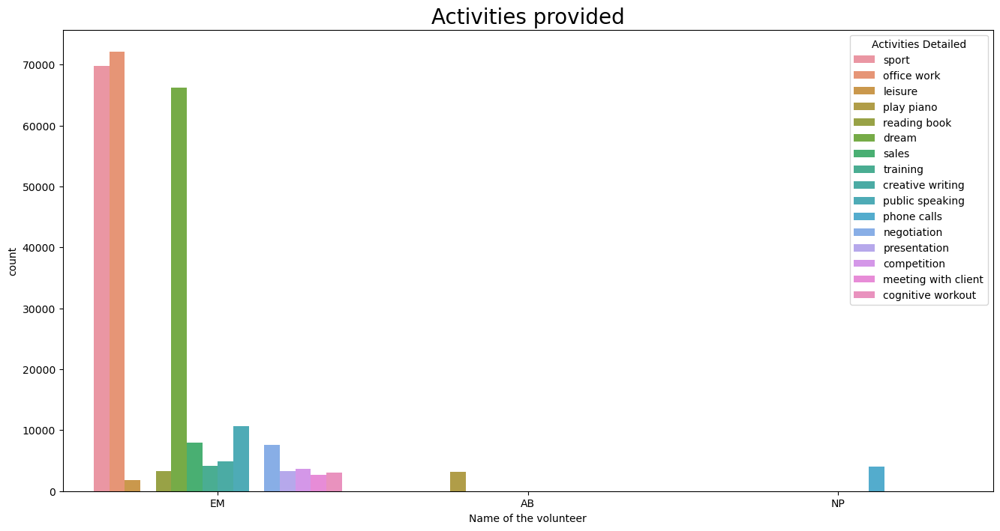

In [4]:
plt.figure(figsize=(16,8))
plt.title('Activities provided', fontsize=20)
sns.countplot(x='Name of the volunteer',hue='Activities Detailed', data = data)
plt.show()

Next, we can see that the most frequent activities are sport,office work and dream, i.e. our data is not balanced.

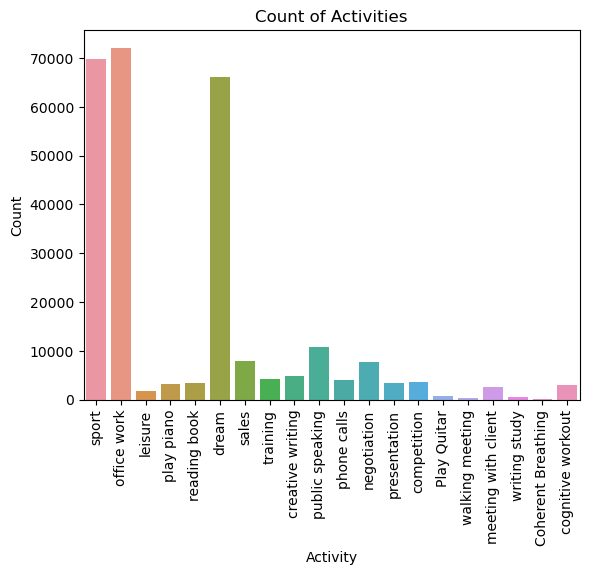

In [25]:
plt.title('No of Datapoints per Activity', fontsize=15)
sns.countplot(data=data, x='Activities Detailed')
plt.title('Count of Activities')
plt.xlabel('Activity')
plt.ylabel('Count')
plt.xticks(rotation=90)  
plt.show()

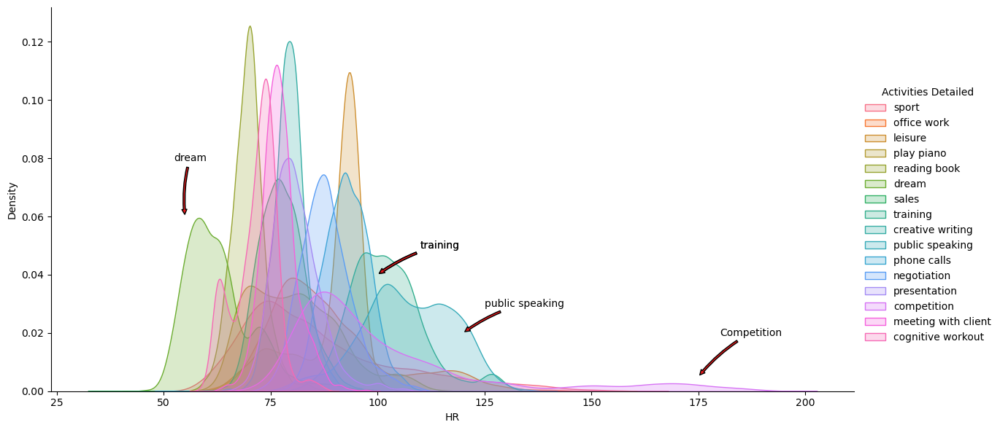

In [20]:
sns.set_palette("Set1", desat=1)

# Create a FacetGrid
facetgrid = sns.FacetGrid(data, hue='Activities Detailed', height=6, aspect=2)

# Map the distribution plot
facetgrid.map(sns.kdeplot, 'HR', fill=True)

# Add legend
facetgrid.add_legend()

# Annotations
plt.annotate("dream", xy=(55, 0.06), xytext=(60, 0.08),
             xycoords='data', textcoords='data',
             va='center', ha='right',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("Competition", xy=(175, 0.005), xytext=(180, 0.02),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("training", xy=(100, 0.04), xytext=(110, 0.05),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("training", xy=(100, 0.04), xytext=(110, 0.05),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("public speaking", xy=(120, 0.02), xytext=(125, 0.03),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

# Show the plot
plt.show()

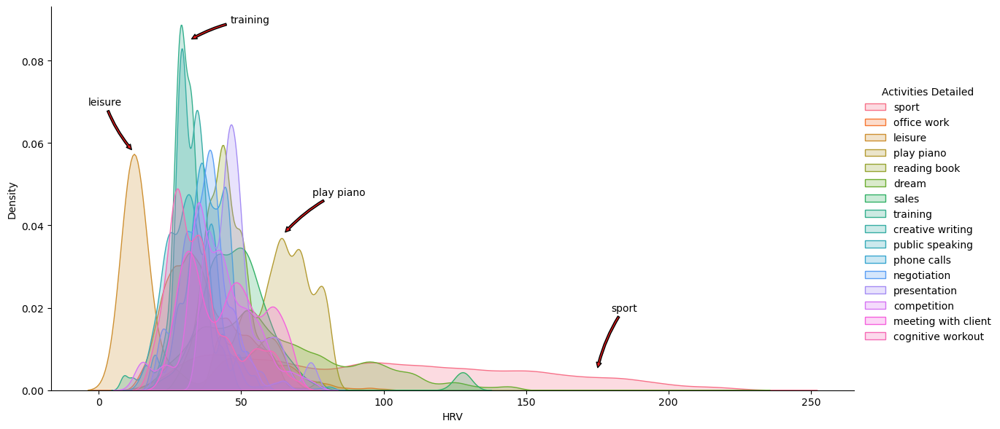

In [35]:
sns.set_palette("Set1", desat=1)

# Create a FacetGrid
facetgrid = sns.FacetGrid(data, hue='Activities Detailed', height=6, aspect=2)

# Map the distribution plot
facetgrid.map(sns.kdeplot, 'HRV', fill=True)

# Add legend
facetgrid.add_legend()

# Annotations
plt.annotate("leisure", xy=(12, 0.058), xytext=(8, 0.07),
             xycoords='data', textcoords='data',
             va='center', ha='right',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("training", xy=(32, 0.085), xytext=(60, 0.09),
             xycoords='data', textcoords='data',
             va='center', ha='right',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("sport", xy=(175, 0.005), xytext=(180, 0.02),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))

plt.annotate("play piano", xy=(65, 0.038), xytext=(75, 0.048),
             xycoords='data', textcoords='data',
             va='center', ha='left',
             arrowprops=dict(arrowstyle="simple", connectionstyle="arc3,rad=0.1"))


# Show the plot
plt.show()

<Figure size 1000x600 with 0 Axes>

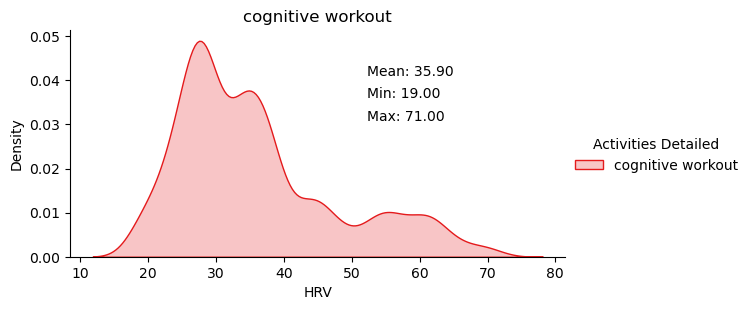

<Figure size 1000x600 with 0 Axes>

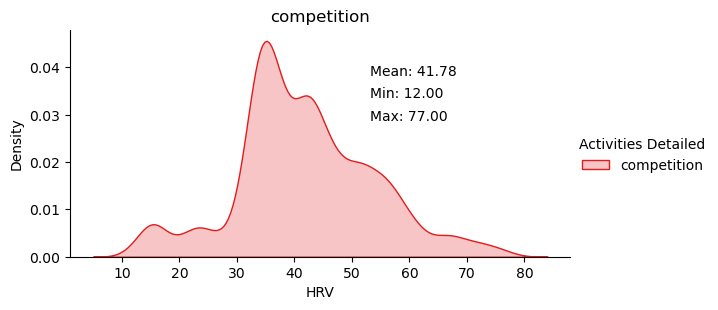

<Figure size 1000x600 with 0 Axes>

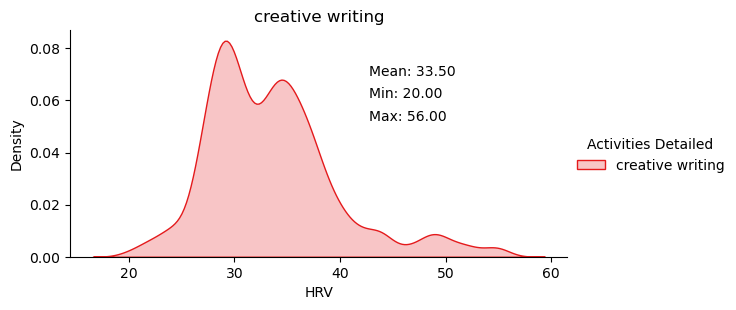

<Figure size 1000x600 with 0 Axes>

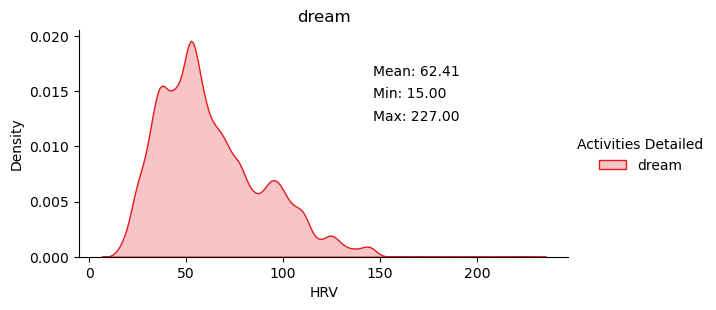

<Figure size 1000x600 with 0 Axes>

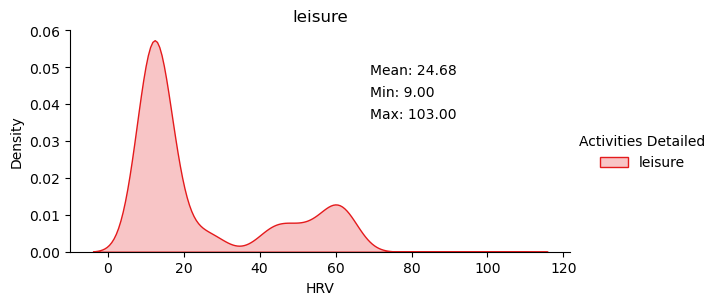

<Figure size 1000x600 with 0 Axes>

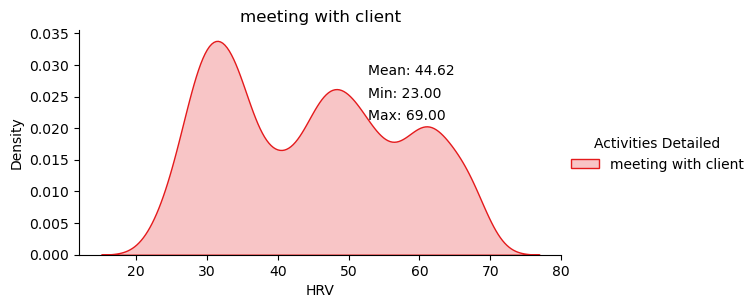

<Figure size 1000x600 with 0 Axes>

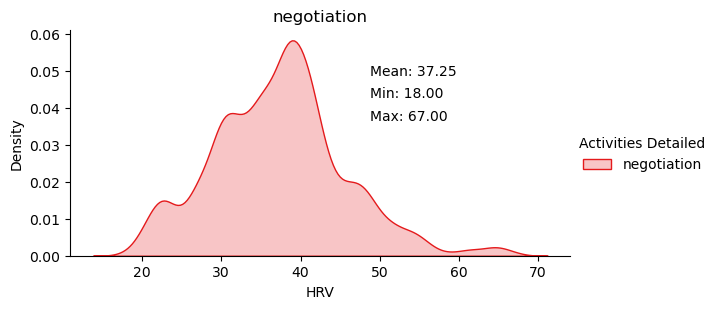

<Figure size 1000x600 with 0 Axes>

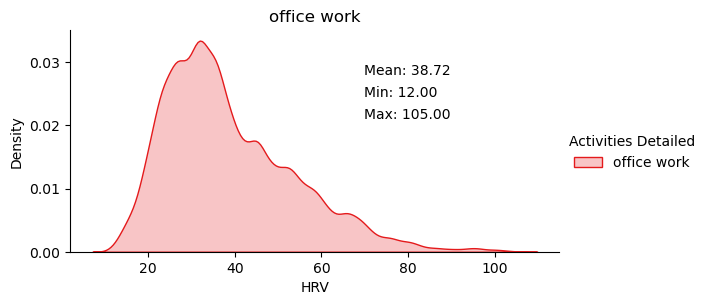

<Figure size 1000x600 with 0 Axes>

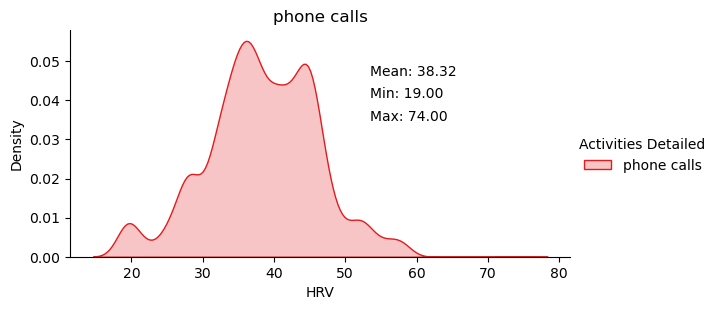

<Figure size 1000x600 with 0 Axes>

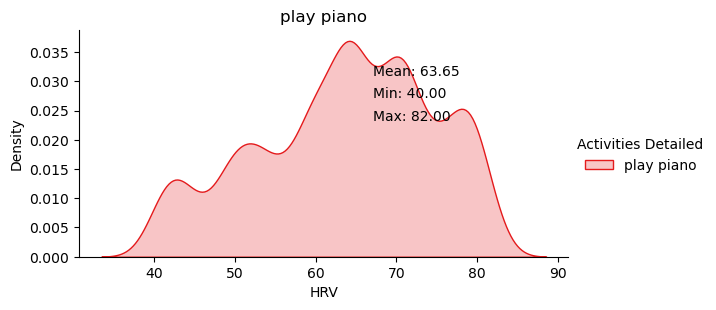

<Figure size 1000x600 with 0 Axes>

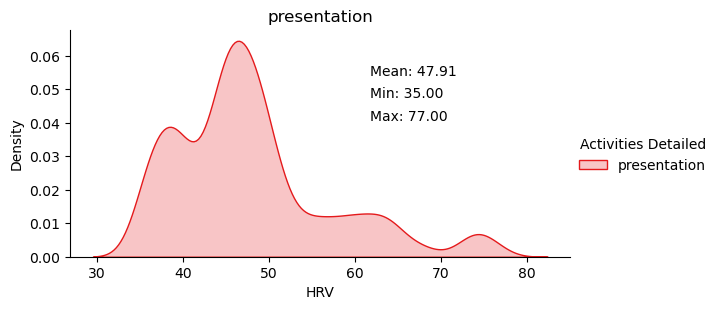

<Figure size 1000x600 with 0 Axes>

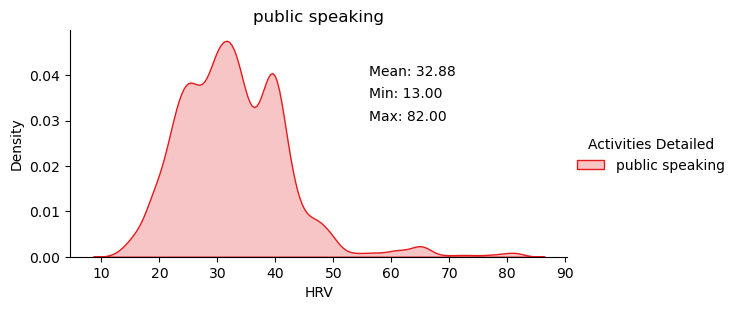

<Figure size 1000x600 with 0 Axes>

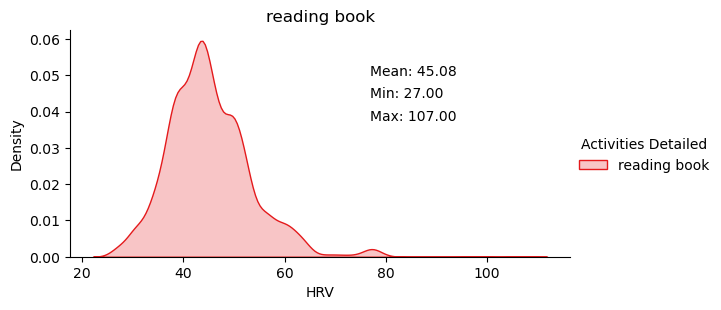

<Figure size 1000x600 with 0 Axes>

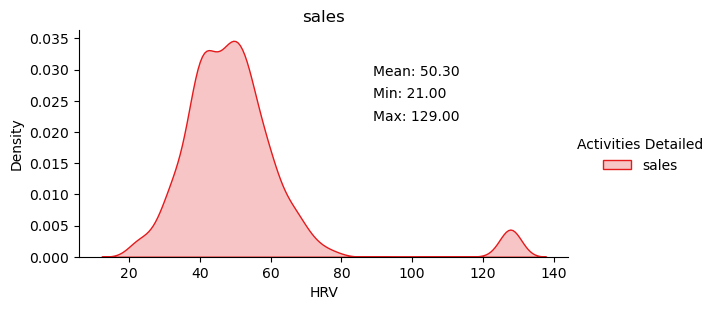

<Figure size 1000x600 with 0 Axes>

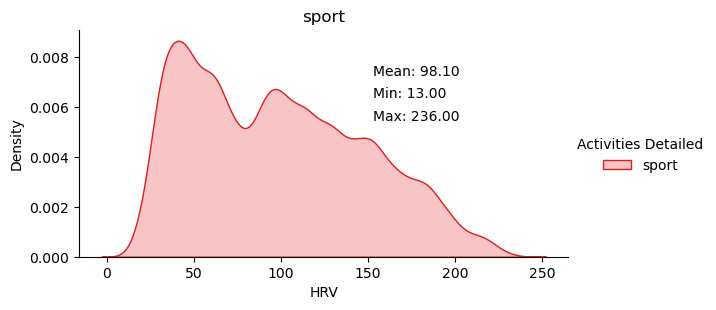

<Figure size 1000x600 with 0 Axes>

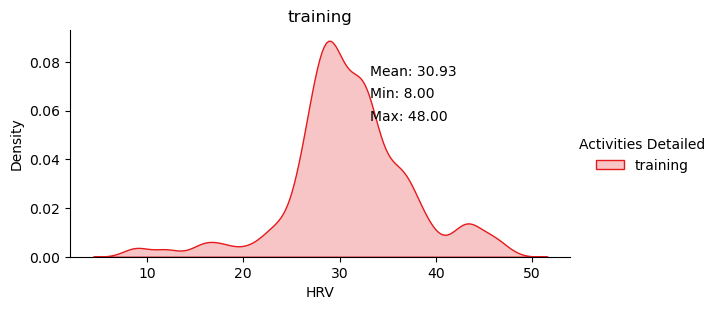

In [24]:
sns.set_palette("Set1", desat=1)

# Iterate over each label and corresponding dataframe
for label, df in smaller_dfs.items():
    # Create a new plot for each dataframe
    plt.figure(figsize=(10, 6))

    # Create a FacetGrid for the current dataframe
    facetgrid = sns.FacetGrid(df, hue='Activities Detailed', height=3, aspect=2)

    # Map the distribution plot
    facetgrid.map(sns.kdeplot, 'HRV', fill=True)

    # Add legend
    facetgrid.add_legend()
    
    mean_val = df['HRV'].mean()
    min_val = df['HRV'].min()
    max_val = df['HRV'].max()

    # Add text annotations for mean, min, and max values
    plt.text(0.6, 0.8, f"Mean: {mean_val:.2f}", transform=plt.gca().transAxes)
    plt.text(0.6, 0.7, f"Min: {min_val:.2f}", transform=plt.gca().transAxes)
    plt.text(0.6, 0.6, f"Max: {max_val:.2f}", transform=plt.gca().transAxes)


    # Set title
    plt.title(label)

    # Show the plot
    plt.show()

In [55]:
groups = data.groupby('Activities Detailed')

# Create an empty dictionary to store the smaller dataframes
smaller_dfs = {}

# Iterate over each group and create separate dataframes
for label, group_df in groups:
    smaller_dfs[label] = group_df.copy()

<Figure size 1000x600 with 0 Axes>

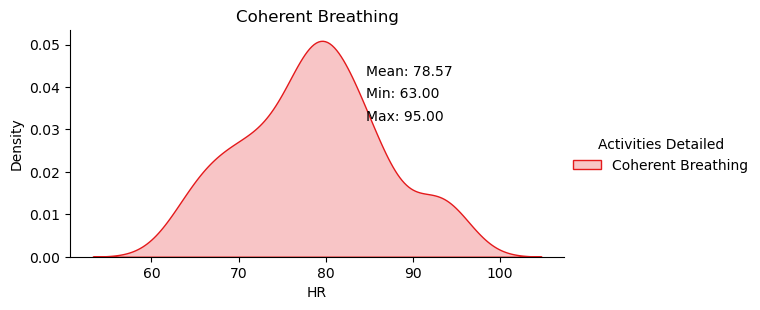

<Figure size 1000x600 with 0 Axes>

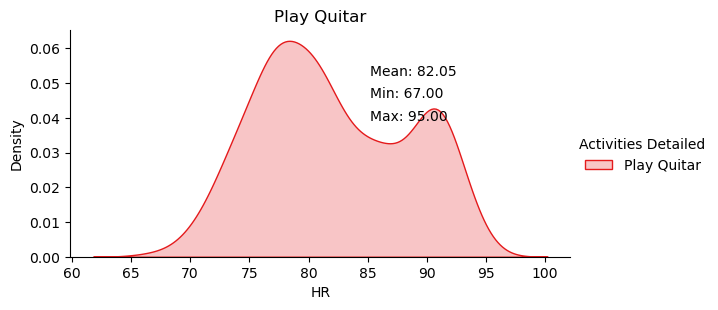

<Figure size 1000x600 with 0 Axes>

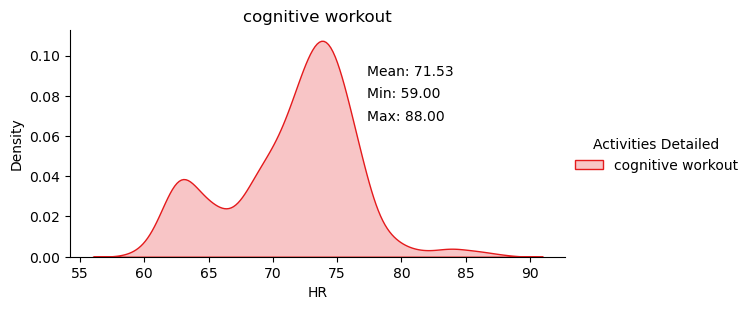

<Figure size 1000x600 with 0 Axes>

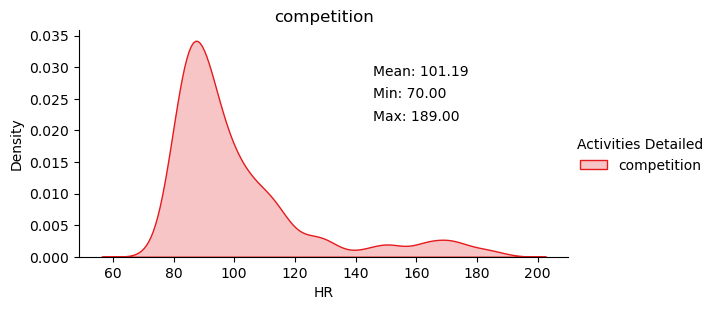

<Figure size 1000x600 with 0 Axes>

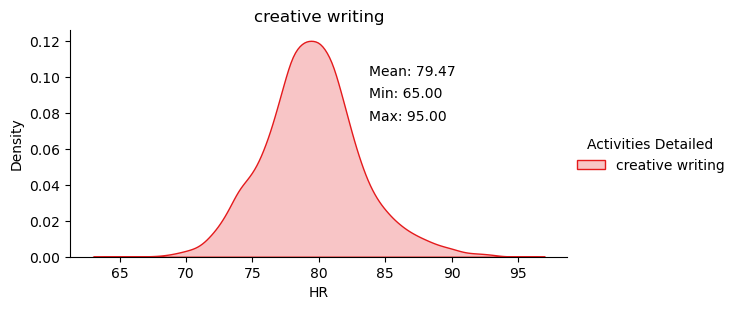

<Figure size 1000x600 with 0 Axes>

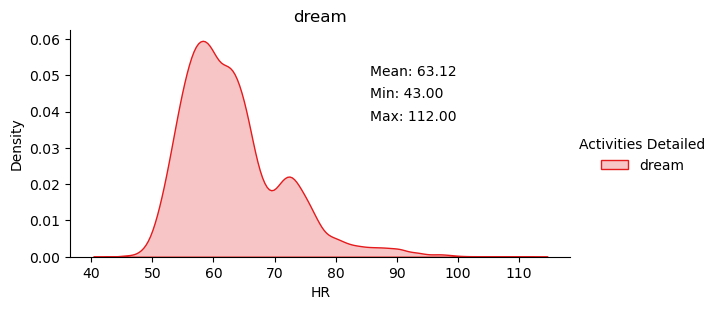

<Figure size 1000x600 with 0 Axes>

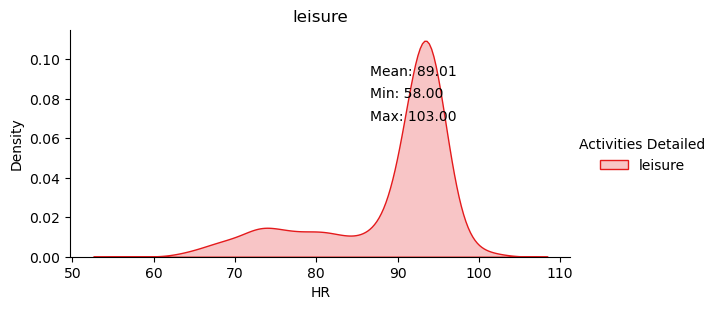

<Figure size 1000x600 with 0 Axes>

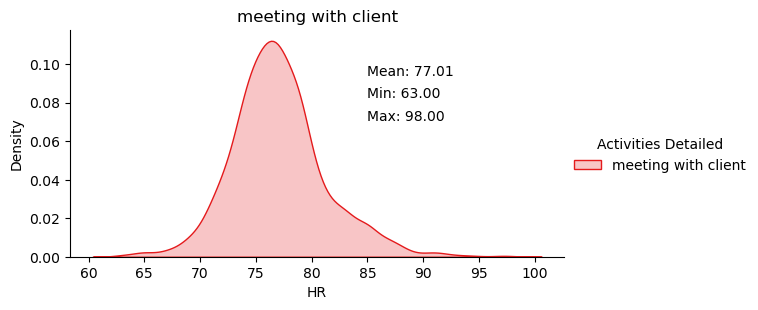

<Figure size 1000x600 with 0 Axes>

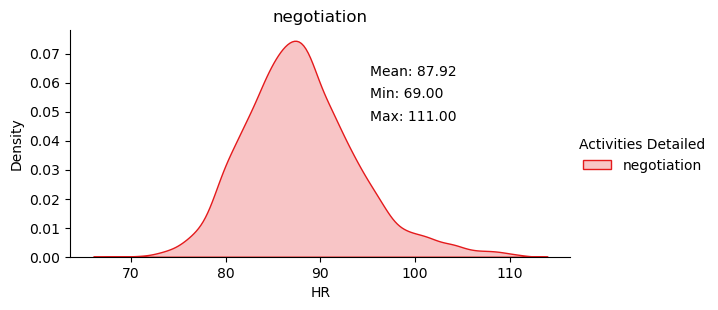

<Figure size 1000x600 with 0 Axes>

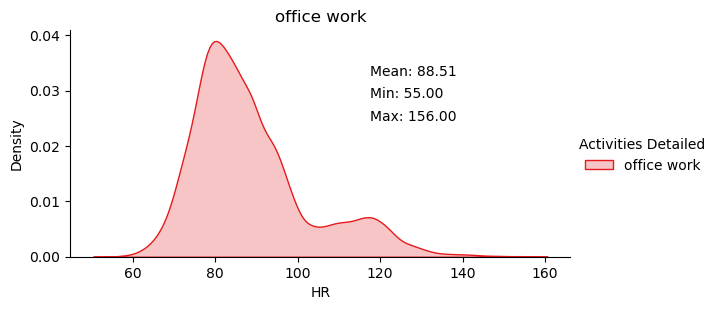

<Figure size 1000x600 with 0 Axes>

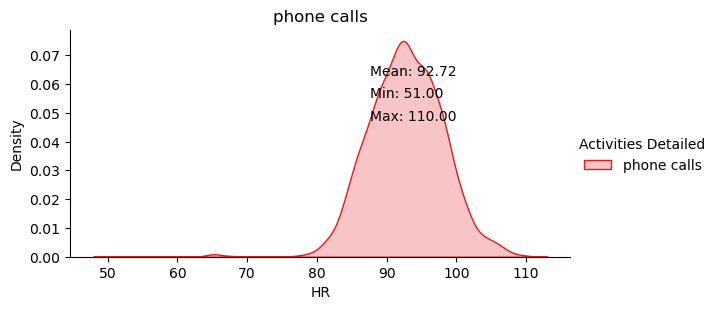

<Figure size 1000x600 with 0 Axes>

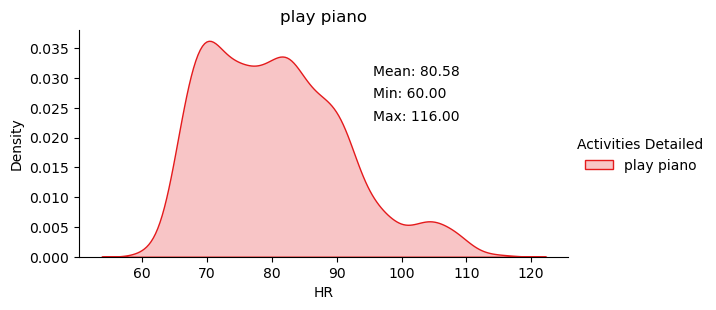

<Figure size 1000x600 with 0 Axes>

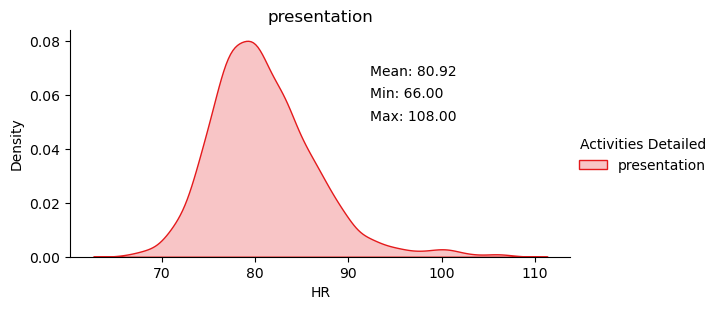

<Figure size 1000x600 with 0 Axes>

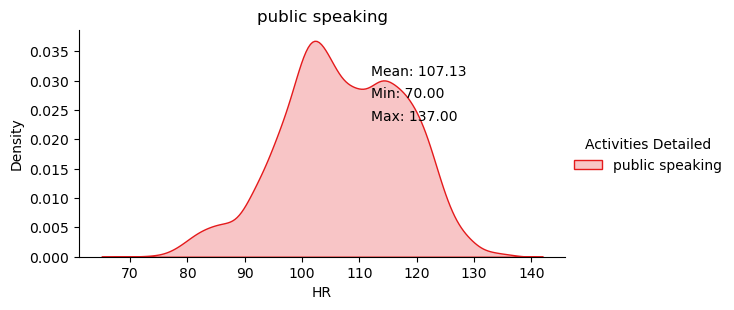

<Figure size 1000x600 with 0 Axes>

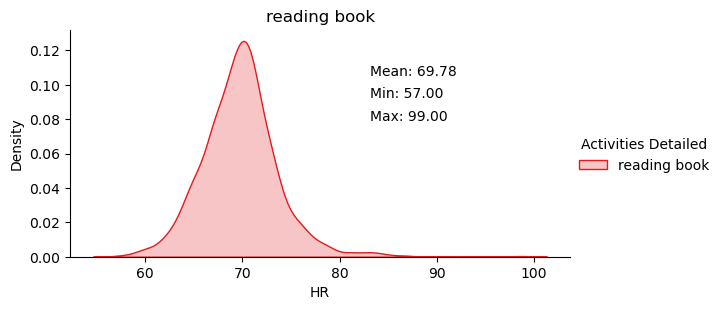

<Figure size 1000x600 with 0 Axes>

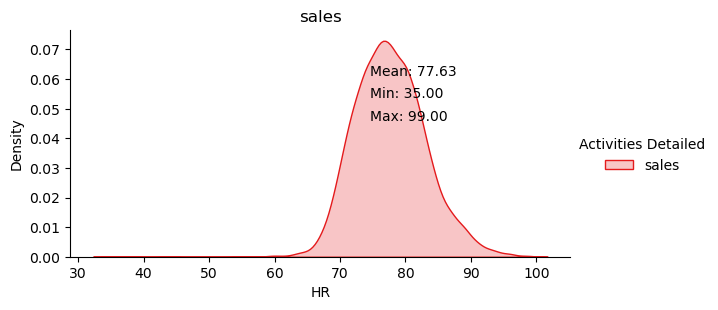

<Figure size 1000x600 with 0 Axes>

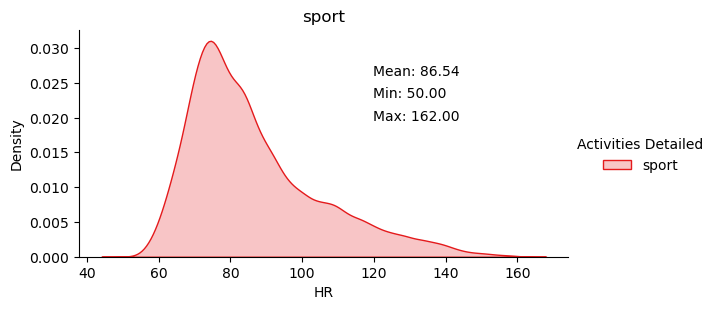

<Figure size 1000x600 with 0 Axes>

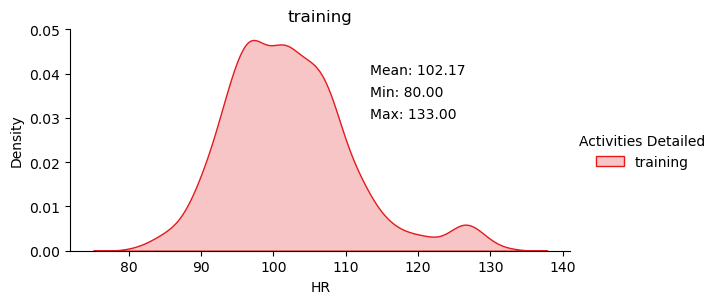

<Figure size 1000x600 with 0 Axes>

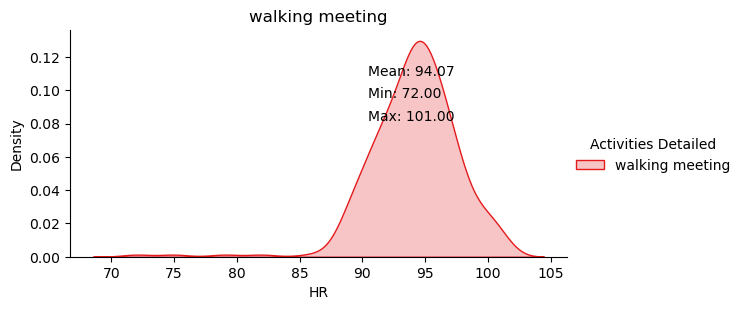

<Figure size 1000x600 with 0 Axes>

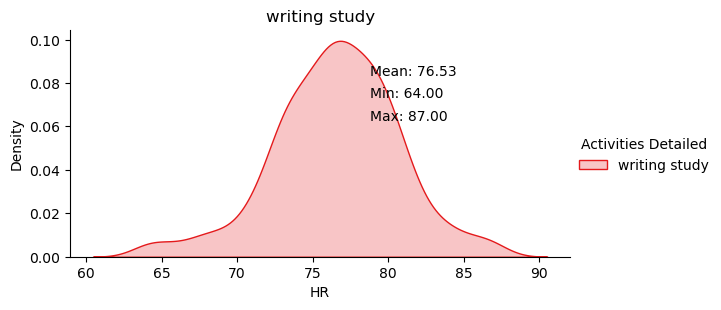

In [56]:
sns.set_palette("Set1", desat=1)

# Iterate over each label and corresponding dataframe
for label, df in smaller_dfs.items():
    # Create a new plot for each dataframe
    plt.figure(figsize=(10, 6))

    # Create a FacetGrid for the current dataframe
    facetgrid = sns.FacetGrid(df, hue='Activities Detailed', height=3, aspect=2)

    # Map the distribution plot
    facetgrid.map(sns.kdeplot, 'HR', fill=True)

    # Add legend
    facetgrid.add_legend()
    
    mean_val = df['HR'].mean()
    min_val = df['HR'].min()
    max_val = df['HR'].max()

    # Add text annotations for mean, min, and max values
    plt.text(0.6, 0.8, f"Mean: {mean_val:.2f}", transform=plt.gca().transAxes)
    plt.text(0.6, 0.7, f"Min: {min_val:.2f}", transform=plt.gca().transAxes)
    plt.text(0.6, 0.6, f"Max: {max_val:.2f}", transform=plt.gca().transAxes)


    # Set title
    plt.title(label)

    # Show the plot
    plt.show()

From these plots we can see that:
* Competition, Training and Sport are right skewed - most of the time the heart rate is in range 50-80 and there are some instances of excessively high heart rate of 130-160

<Figure size 1000x600 with 0 Axes>

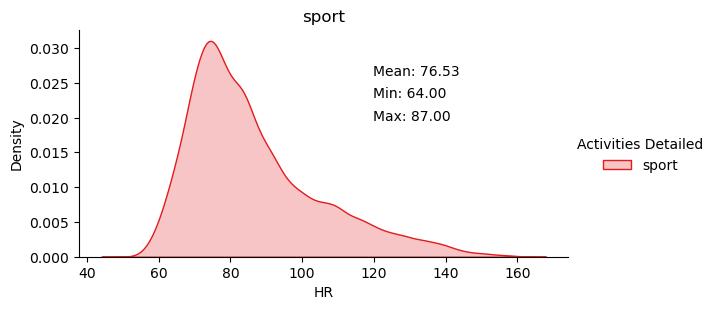

In [130]:
plt.figure(figsize=(10, 6))
sns.set_palette("Set1", desat=1)
facetgrid = sns.FacetGrid(smaller_dfs['sport'], hue='Activities Detailed', height=3, aspect=2)
facetgrid.map(sns.kdeplot, 'HR', fill=True)
facetgrid.add_legend()
mean_val = df['HR'].mean()
min_val = df['HR'].min()
max_val = df['HR'].max()

# Add text annotations for mean, min, and max values
plt.text(0.6, 0.8, f"Mean: {mean_val:.2f}", transform=plt.gca().transAxes)
plt.text(0.6, 0.7, f"Min: {min_val:.2f}", transform=plt.gca().transAxes)
plt.text(0.6, 0.6, f"Max: {max_val:.2f}", transform=plt.gca().transAxes)

plt.title('sport')
plt.show()    

* Meeting with client, Negotiation, Creative writing are normaly distributed with a heart rate usually around 80 

<Figure size 1000x600 with 0 Axes>

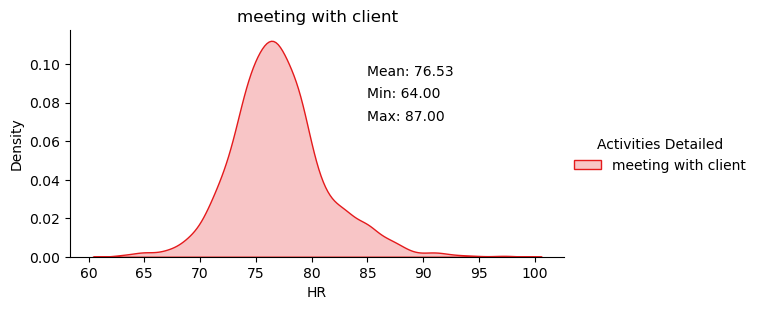

In [132]:
plt.figure(figsize=(10, 6))
sns.set_palette("Set1", desat=1)
facetgrid = sns.FacetGrid(smaller_dfs['meeting with client'], hue='Activities Detailed', height=3, aspect=2)
facetgrid.map(sns.kdeplot, 'HR', fill=True)
facetgrid.add_legend()
mean_val = df['HR'].mean()
min_val = df['HR'].min()
max_val = df['HR'].max()

# Add text annotations for mean, min, and max values
plt.text(0.6, 0.8, f"Mean: {mean_val:.2f}", transform=plt.gca().transAxes)
plt.text(0.6, 0.7, f"Min: {min_val:.2f}", transform=plt.gca().transAxes)
plt.text(0.6, 0.6, f"Max: {max_val:.2f}", transform=plt.gca().transAxes)

plt.title('meeting with client')
plt.show() 

* Some activities exhibit bimodal distributions (Play guitar, Play Piano, Cognitive Workout) 

<Figure size 1000x600 with 0 Axes>

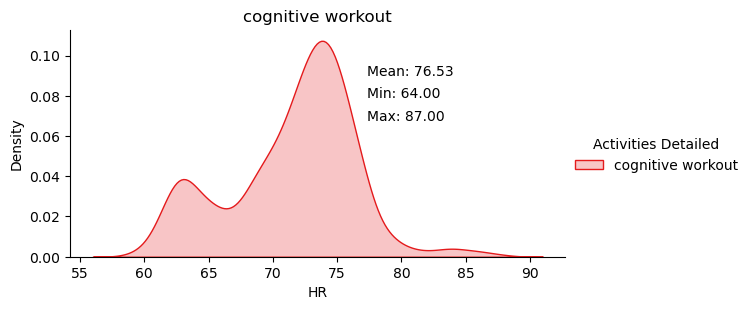

In [134]:
plt.figure(figsize=(10, 6))
sns.set_palette("Set1", desat=1)
facetgrid = sns.FacetGrid(smaller_dfs['cognitive workout'], hue='Activities Detailed', height=3, aspect=2)
facetgrid.map(sns.kdeplot, 'HR', fill=True)
facetgrid.add_legend()
mean_val = df['HR'].mean()
min_val = df['HR'].min()
max_val = df['HR'].max()

# Add text annotations for mean, min, and max values
plt.text(0.6, 0.8, f"Mean: {mean_val:.2f}", transform=plt.gca().transAxes)
plt.text(0.6, 0.7, f"Min: {min_val:.2f}", transform=plt.gca().transAxes)
plt.text(0.6, 0.6, f"Max: {max_val:.2f}", transform=plt.gca().transAxes)

plt.title('cognitive workout')
plt.show() 

We can see detect better potential outliers with boxplots 

In [66]:
#choose only numerical data for correlation
columns_to_exclude = ['Year','Month', 'Weekday', 'Hour', 'Activities','Name of the volunteer']
numerical_columns  = data.drop(columns=columns_to_exclude)
numerical_columns = numerical_columns.select_dtypes(include=[np.number])  # Select numerical columns
non_binary_columns = numerical_columns.loc[:, ~(numerical_columns.isin([0, 1])).all()]  # Exclude columns with only 0s and 1s
# Exclude these columns as they don't provide important information
#columns_to_exclude = ['Year', 'Hour']

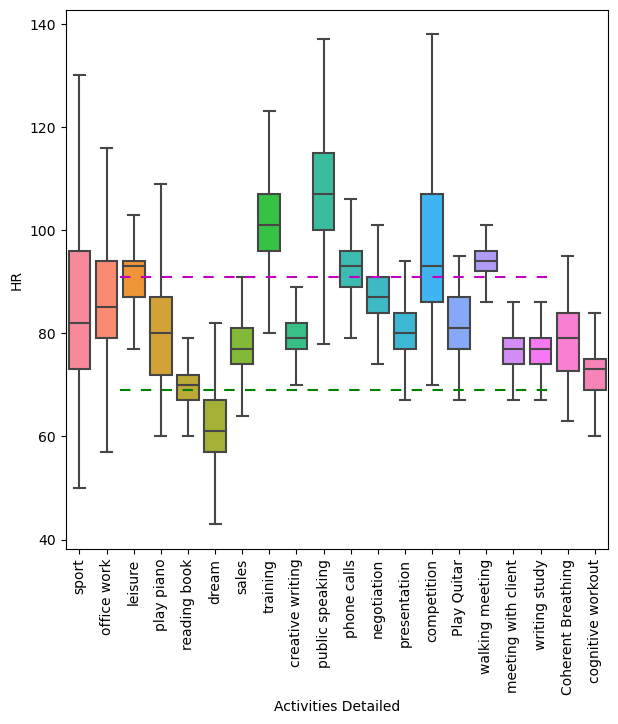

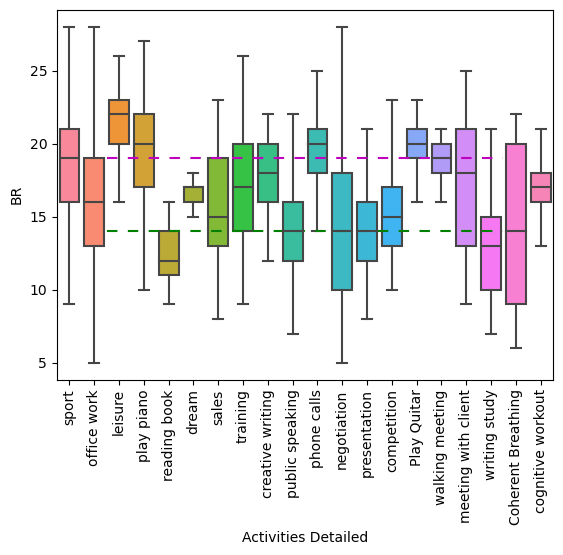

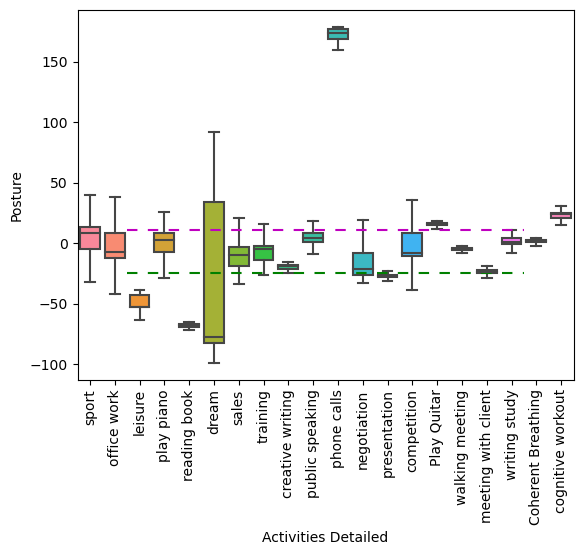

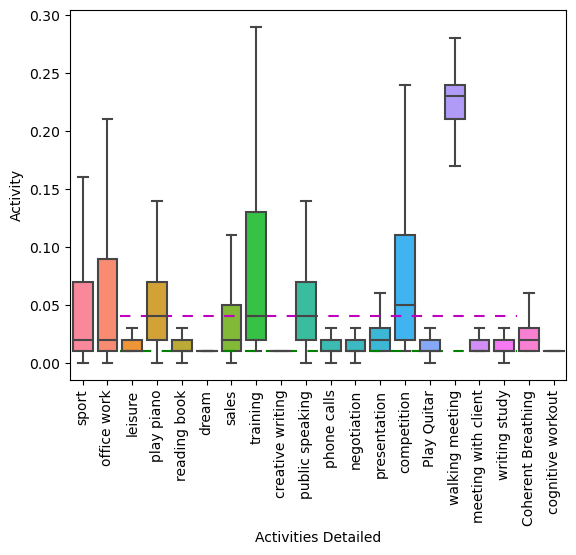

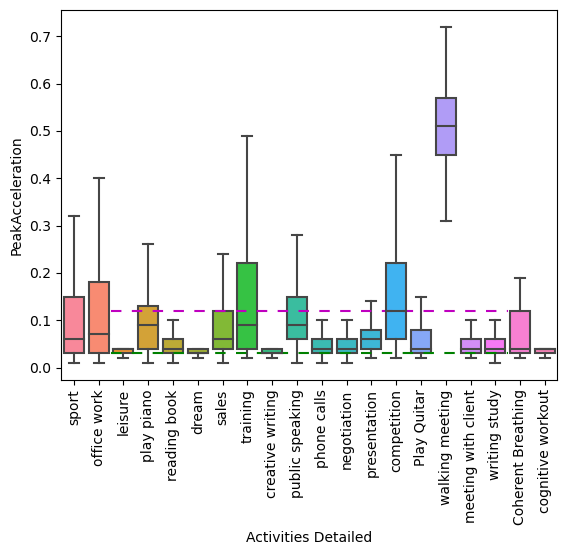

...

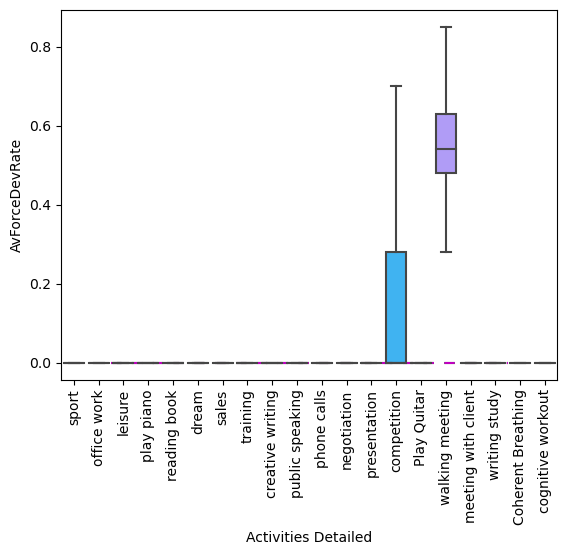

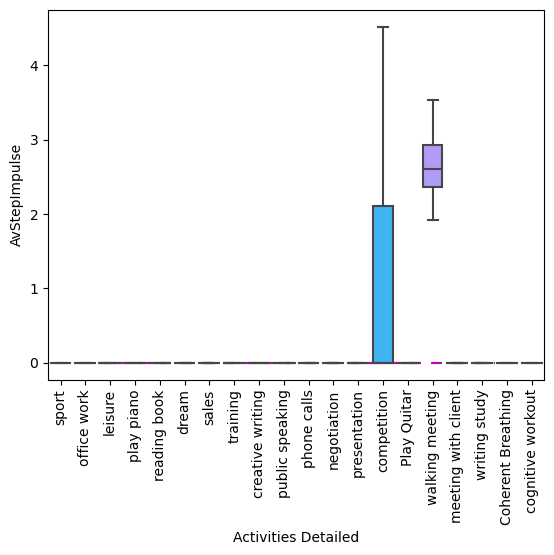

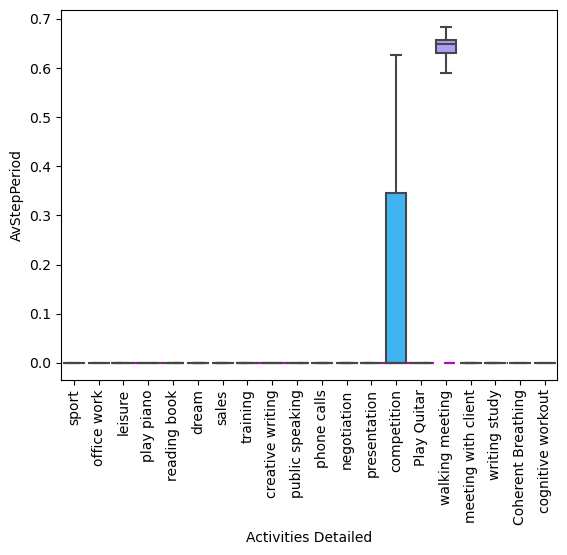

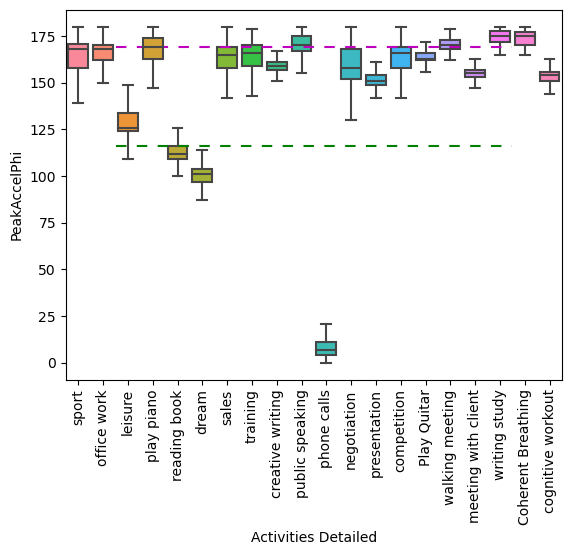

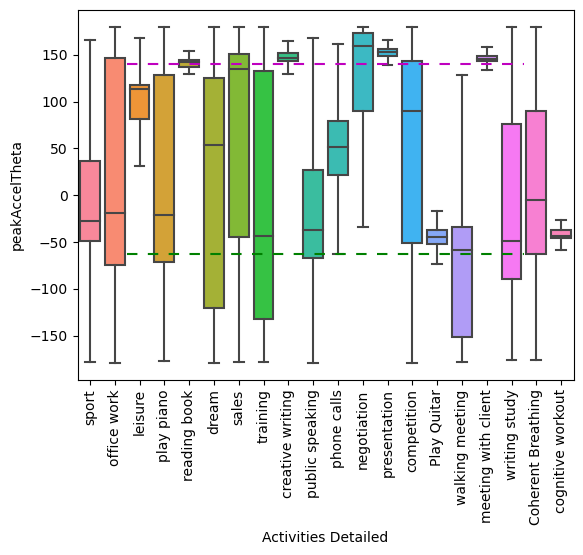

In [69]:
# Create boxplots for each activity and variable
plt.figure(figsize=(7, 7))

# Iterate over each numeric column
# Iterate over each numeric column
for column in non_binary_columns:
        # Calculate the 25th and 75th quartiles
        quartile_25 = np.percentile(data[column], 25)
        quartile_75 = np.percentile(data[column], 75)

        # Create a boxplot for each column
        sns.boxplot(x='Activities Detailed', y=column, data=data, showfliers=False, saturation=1)
        plt.ylabel(column)
        plt.axhline(y=quartile_25, xmin=0.1, xmax=0.9, dashes=(5, 5), c='g')
        plt.axhline(y=quartile_75, xmin=0.1, xmax=0.9, dashes=(5, 5), c='m')
        plt.xticks(rotation=90)
        plt.show()

From the boxplots we can see again that the variables are rarely normally distributed with many instances above the 75th quartile.

## Correlation Analysis

In [5]:
#choose only numerical data for correlation
columns_to_exclude = ['Year','Month', 'Weekday', 'Hour', 'Activities', 'Activities Detailed','Name of the volunteer']
numerical_columns  = data.drop(columns=columns_to_exclude)
numerical_columns = numerical_columns.select_dtypes(include=[np.number])  # Select numerical columns
non_binary_columns = numerical_columns.loc[:, ~(numerical_columns.isin([0, 1])).all()]  # Exclude columns with only 0s and 1s
# Exclude these columns as they don't provide important information
#columns_to_exclude = ['Year', 'Hour']

In [21]:
def feature_normalize(dataset):
    mu = np.mean(dataset,axis = 0)
    sigma = np.std(dataset,axis = 0)
    return (dataset - mu)/sigma

In [22]:
non_binary_columns = feature_normalize(non_binary_columns)

In [10]:
correlation_matrix = non_binary_columns.corr()

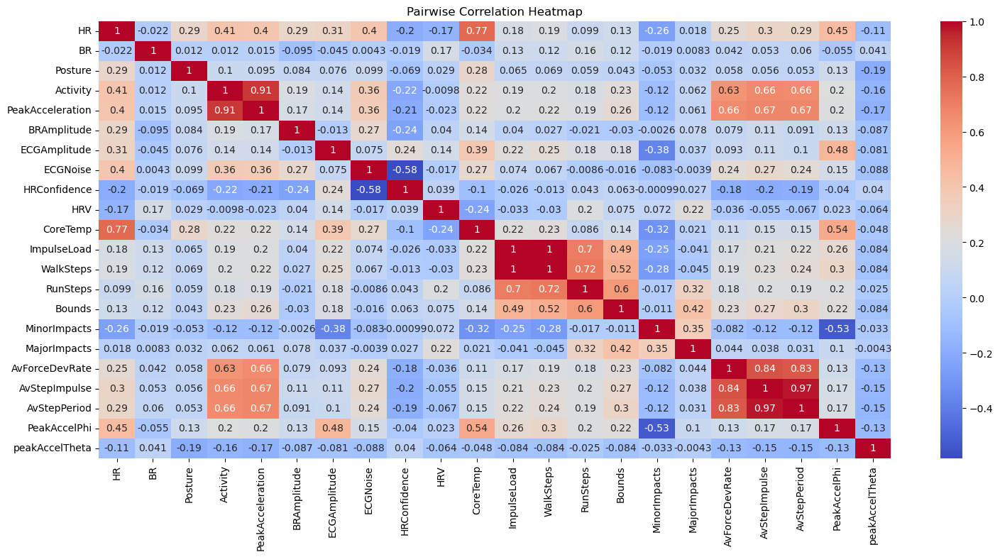

In [11]:
# Create the heatmap
plt.figure(figsize=(18, 8))  # Adjust the figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Set the plot title
plt.title('Pairwise Correlation Heatmap')

# Show the plot
plt.show()

From the correlation matrix we can see that following features are highly correlated
* 'Activity','PeakAcceleration' - we leave only 'Activity'
* 'ECGNoise' and 'HRConfidence' - we leave only 'ECGNoise'
* 'ImpulseLoad', 'WalkSteps','RunSteps','Bounds' - we leave only 'ImpulseLoad'
* 'AvForceDevRate','AvStepImpulse','AvStepPeriod' - we leave only 'AvForceDevRate'
* 'CoreTemp' and 'HR' - we leave only 'HR'
* 'MinorImpacts' with 'PeakAccelPhi' - we leave only 'PeakAccelPhi'

Therefore,following columns can be deleted: 'PeakAcceleration','HRConfidence','AvForceDevRate','AvStepImpulse','WalkSteps','RunSteps','Bounds','CoreTemp', 'MinorImpacts', 'MajorImpacts'

<Axes: xlabel='WalkSteps', ylabel='ImpulseLoad'>

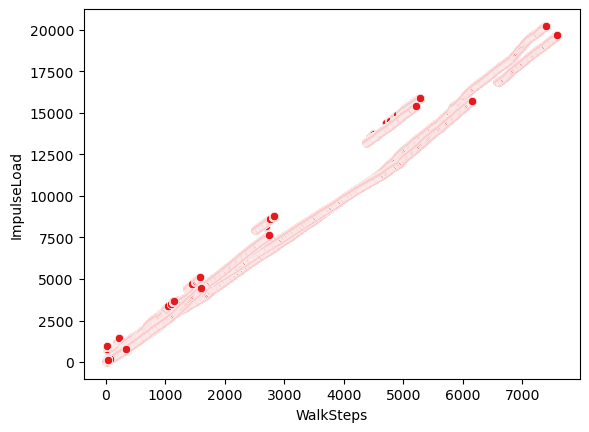

In [486]:
sns.scatterplot(x=non_binary_columns['WalkSteps'],y=non_binary_columns['ImpulseLoad'])    
'WalkSteps','RunSteps','Bounds','AvStepImpulse','AvStepPeriod'                                                               

<Axes: xlabel='HR', ylabel='CoreTemp'>

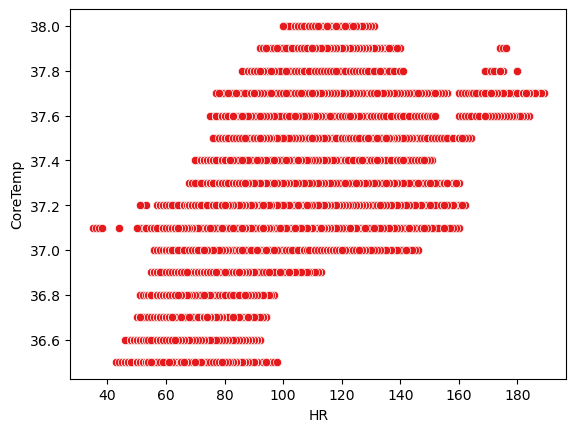

In [71]:
sns.scatterplot(x=non_binary_columns['HR'],y=non_binary_columns['CoreTemp'])

<Axes: xlabel='RunSteps', ylabel='Bounds'>

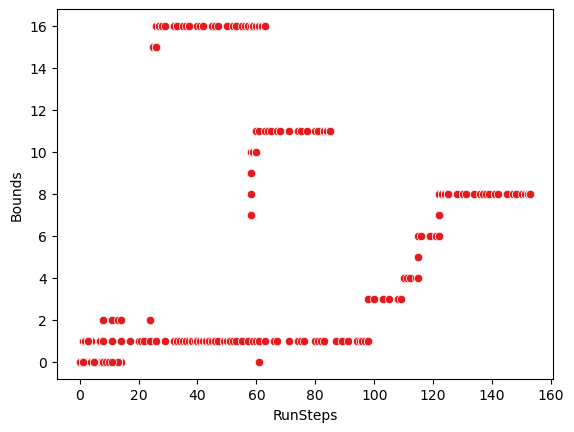

In [72]:
sns.scatterplot(x=data['RunSteps'],y=data['Bounds'])

<Axes: xlabel='HR', ylabel='ECGNoise'>

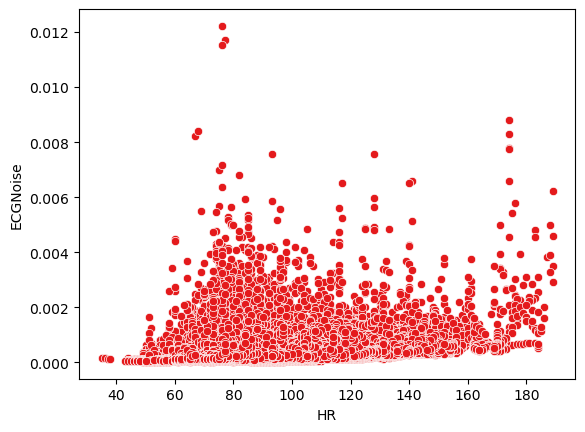

In [73]:
sns.scatterplot(x=data['HR'],y=data['ECGNoise'])

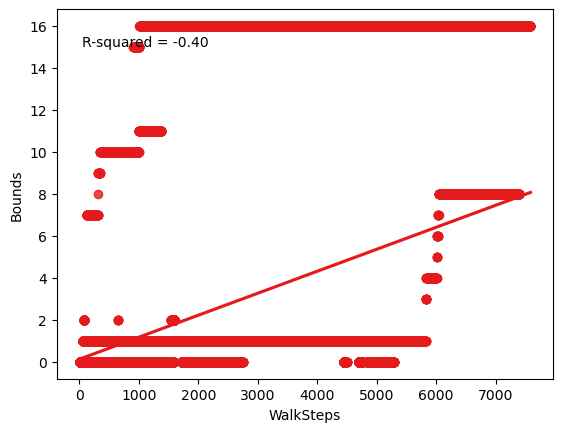

In [74]:
sns.regplot(x='WalkSteps', y='Bounds', data=data)

# Calculate the R-squared value
r_squared = r2_score(data['WalkSteps'], data['Bounds'])

# Annotate the R-squared value on the plot
plt.annotate(f'R-squared = {r_squared:.2f}', xy=(0.05, 0.9), xycoords='axes fraction')
# Show the plot
plt.show()

It is hard to see any correlation simply from the plots between any of the variables. These will be analyzed via clustering and pca as a next step

## Clustering Analysis

### Data Preparation

In [50]:
#choose only numerical data for correlation
columns_to_exclude = ['Year','Month', 'Weekday', 'Hour', 'Date','Activities', 'Activities Detailed','Name of the volunteer', 
                      'PeakAcceleration','HRConfidence','AvForceDevRate','AvStepImpulse','WalkSteps','RunSteps','Bounds',
                      'CoreTemp', 'MinorImpacts', 'MajorImpacts']
numerical_columns  = data.drop(columns=columns_to_exclude)
numerical_columns = numerical_columns.select_dtypes(include=[np.number])  # Select numerical columns
non_binary_columns = numerical_columns.loc[:, ~(numerical_columns.isin([0, 1])).all()]  # Exclude columns with only 0s and 1s
# Exclude these columns as they don't provide important information
#columns_to_exclude = ['Year', 'Hour']

In [62]:
#normalize
df_normalized = feature_normalize(non_binary_columns)

In [66]:
scaled_data = scaler.fit_transform(df_normalized)

In [67]:
column_names = df_normalized.columns.tolist()

In [68]:
df_scaled = pd.DataFrame(scaled_data, columns=column_names, index=df_normalized.index)

## PCA

In [70]:
pca = PCA(n_components=0.80)
principalComponents = pca.fit_transform(df_normalized)

principalDf = pd.DataFrame(data = df_normalized
             , columns = ['principal component 1', 'principal component 2'])

In [71]:
components = pca.components_

In [72]:
len(components)

9

It turns out that we need 8 components to explain 80% of the variance in the data. This is not very promising

In [73]:
# Get the feature names from your original DataFrame
feature_names = df_scaled.columns

# Create a DataFrame to store the feature names and weights for each principal component
components_df = pd.DataFrame(components, columns=feature_names)
components_df = components_df.fillna(0)

components_df_sorted = components_df.apply(lambda row: row.abs().nlargest(6), axis=1)

# Print the sorted features for each principal component
for i, component_features in enumerate(components_df_sorted.iterrows()):
    print(f"Principal Component {i+1}:")
    for feature, weight in component_features[1].items():
        print(f"Feature '{feature}': {weight:.4f}")
    print()

Principal Component 1:
Feature 'Activity': 0.3238
Feature 'AvForceDevRate': 0.3012
Feature 'AvStepImpulse': 0.3276
Feature 'AvStepPeriod': 0.3259
Feature 'BR': nan
Feature 'BRAmplitude': nan
Feature 'Bounds': nan
Feature 'CoreTemp': nan
Feature 'ECGAmplitude': nan
Feature 'ECGNoise': nan
Feature 'HR': 0.2627
Feature 'HRConfidence': nan
Feature 'HRV': nan
Feature 'ImpulseLoad': nan
Feature 'MajorImpacts': nan
Feature 'MinorImpacts': nan
Feature 'PeakAccelPhi': nan
Feature 'PeakAcceleration': 0.3279
Feature 'Posture': nan
Feature 'RunSteps': nan
Feature 'WalkSteps': nan
Feature 'peakAccelTheta': nan

Principal Component 2:
Feature 'Activity': 0.2132
Feature 'AvForceDevRate': nan
Feature 'AvStepImpulse': nan
Feature 'AvStepPeriod': nan
Feature 'BR': nan
Feature 'BRAmplitude': nan
Feature 'Bounds': 0.2940
Feature 'CoreTemp': nan
Feature 'ECGAmplitude': nan
Feature 'ECGNoise': nan
Feature 'HR': nan
Feature 'HRConfidence': 0.2190
Feature 'HRV': nan
Feature 'ImpulseLoad': 0.4000
Feature 'Majo

In [452]:
explained_variance_ratio = pca.explained_variance_ratio_

In [453]:
explained_variance_ratio

array([0.25135305, 0.12623686, 0.11045559, 0.07481526, 0.06557407,
       0.05262752, 0.04967368, 0.04609301, 0.03432292])

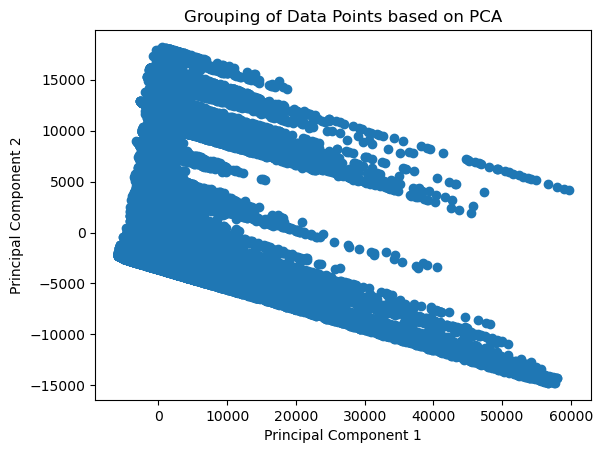

In [52]:
# Plotting the transformed data
plt.scatter(transformed_data[:, 0], transformed_data[:, 1])
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Grouping of Data Points based on PCA')
plt.show()

We can conclude that PCA is not sufficient to reduce dimensionality for this dataset. 

## K-means Clustering

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


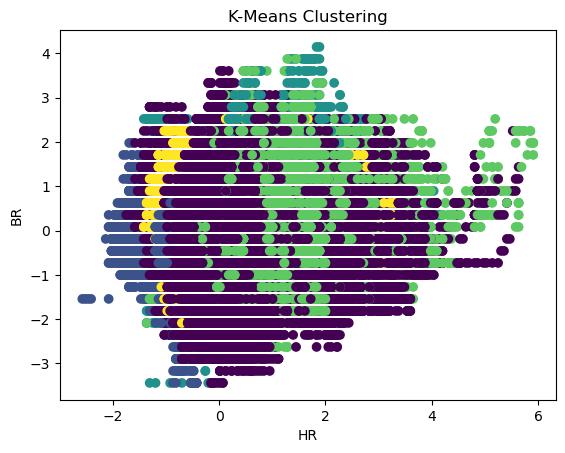

In [77]:
data_cluster = df_scaled.values
# Define the number of clusters
num_clusters = 5

# Initialize and fit the k-means model
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(data_cluster)

# Access the cluster labels
cluster_labels = kmeans.labels_

# Plotting the clustered data
plt.scatter(data_cluster[:, 0], data_cluster[:, 1], c=cluster_labels)
plt.xlabel('HR')
plt.ylabel('BR')
plt.title('K-Means Clustering')
plt.show()

In [76]:
df_scaled

,HR,BR,Posture,Activity,PeakAcceleration,BRAmplitude,ECGAmplitude,ECGNoise,HRConfidence,HRV,...,WalkSteps,RunSteps,Bounds,MinorImpacts,MajorImpacts,AvForceDevRate,AvStepImpulse,AvStepPeriod,PeakAccelPhi,peakAccelTheta
Time,,,,,,,,,,,,,,,,,,,,,
2020-03-26 09:02:28,-0.148830,-0.460515,0.554806,-0.496756,-0.614565,-0.519350,-0.844611,-0.354917,0.257792,-0.391358,...,-0.618357,-0.466107,-0.368706,-0.626321,-0.183477,-0.286269,-0.336152,-0.334920,0.514409,-0.635064
2020-03-26 09:02:29,-0.148830,-0.460515,0.554806,-0.496756,-0.019181,-0.592829,-0.889056,-0.354917,0.257792,-0.391358,...,-0.618357,-0.466107,-0.368706,-0.626321,-0.183477,-0.286269,-0.336152,-0.334920,0.664396,-0.966603
2020-03-26 09:02:30,-0.148830,-0.460515,0.576565,-0.496756,-0.540142,-0.630422,-0.889056,-0.354917,0.257792,-0.391358,...,-0.618357,-0.466107,-0.368706,-0.626321,-0.183477,-0.286269,-0.336152,-0.334920,0.544407,-0.608182
2020-03-26 09:02:31,-0.148830,-0.460515,0.576565,-0.496756,-0.614565,-0.614189,-0.911278,-0.354917,0.257792,-0.391358,...,-0.618357,-0.466107,-0.368706,-0.626321,-0.183477,-0.286269,-0.336152,-0.334920,0.514409,-0.572340
2020-03-26 09:02:32,-0.148830,-0.460515,0.576565,-0.637188,-0.614565,-0.659984,-0.911278,-0.354917,0.257792,-0.391358,...,-0.618357,-0.466107,-0.368706,-0.626321,-0.183477,-0.286269,-0.336152,-0.334920,0.514409,-0.635064
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-22 06:35:10,0.126427,0.894236,-0.533123,-0.075462,-0.168027,4.431198,0.422059,3.499499,-4.637096,-0.570372,...,-0.622103,-0.466107,-0.368706,0.013711,-0.183477,3.168370,3.201136,2.029214,-0.175531,0.628371
2022-06-22 06:35:11,0.126427,0.894236,-0.554882,-0.496756,-0.540142,5.840953,0.422059,2.273094,-5.082086,-0.544799,...,-0.622103,-0.466107,-0.368706,0.013711,-0.183477,-0.286269,-0.336152,-0.334920,-0.115536,0.628371
2022-06-22 06:35:12,0.126427,0.623286,-0.576640,-0.075462,0.650627,6.962776,0.422059,3.587099,-5.749571,-0.544799,...,-0.622103,-0.466107,-0.368706,0.013711,-0.183477,-0.286269,-0.336152,-0.334920,-0.385512,0.664213


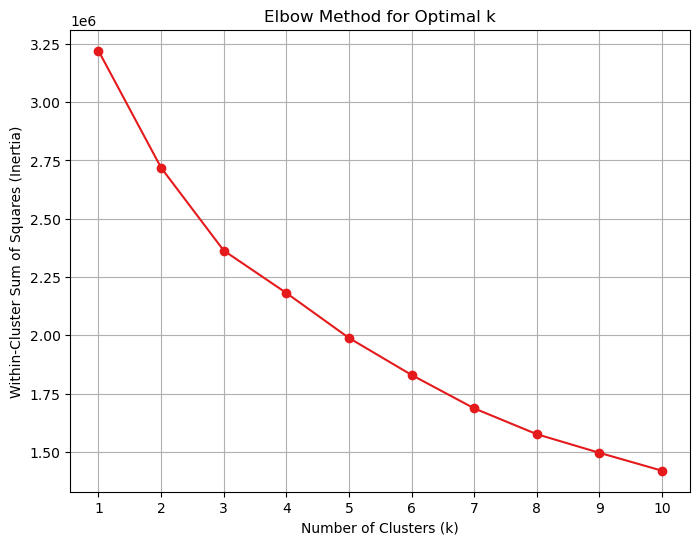

In [494]:
data_cluster = df_scaled.values

# Calculate the within-cluster sum of squares (inertia) for different values of k
inertias = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data_cluster)
    inertias.append(kmeans.inertia_)

# Plot the Elbow Method curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), inertias, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (Inertia)')
plt.title('Elbow Method for Optimal k')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

In [23]:
# Initialize and fit the k-means model
data_cluster = df_scaled.values
kmeans = KMeans(n_clusters=10)
kmeans.fit(data_cluster)

# Access the cluster labels
cluster_labels = kmeans.labels_

# Plotting the clustered data
plt.scatter(data_cluster[:, 0], data_cluster[:, 1], c=cluster_labels)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('K-Means Clustering')
plt.show()

NameError: name 'df_scaled' is not defined

In [75]:
data_cluster[:, 0]

array([-0.14882983, -0.14882983, -0.14882983, ...,  0.12642699,
        0.18147835,  0.18147835])

There are too many interesecting points. It is clear that we need to find alternative way to clusterize the data.

In [496]:
centroids = pd.DataFrame(kmeans.cluster_centers_, columns=non_binary_columns.columns)

# Analyze the differences in feature values across the centroids
feature_importance = centroids.std().sort_values(ascending=False)

# Print the feature importance
print("Feature Importance:")
print(feature_importance)

Feature Importance:
ECGNoise          3.296628
Activity          1.194782
AvStepPeriod      1.132946
Posture           1.039070
BRAmplitude       1.006412
PeakAccelPhi      0.942745
HR                0.890966
ImpulseLoad       0.840067
HRV               0.715952
ECGAmplitude      0.681168
peakAccelTheta    0.679162
BR                0.411128
dtype: float64


ECGNoise,Activity,AvStepPeriod,Posture,BRAmplitude,PeakAccelPhi   
HRImpulseLoad,HRV,ECGAmplitude,peakAccelTheta,BR   

In [497]:
non_binary_columns.columns

Index(['HR', 'BR', 'Posture', 'Activity', 'BRAmplitude', 'ECGAmplitude',
       'ECGNoise', 'HRV', 'ImpulseLoad', 'AvStepPeriod', 'PeakAccelPhi',
       'peakAccelTheta'],
      dtype='object')

## Apply t-sne 

In [2]:
from sklearn.manifold import TSNE
import matplotlib.patheffects as PathEffects
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score

In [6]:
#choose only numerical data for correlation
columns_to_exclude = ['Year','Month', 'Weekday', 'Hour', 'Date','Activities','Name of the volunteer']
numerical_columns  = data.drop(columns=columns_to_exclude)

# Get the numeric columns including "Activities Detailed" column
numeric_columns = numerical_columns.select_dtypes(include=[np.number, "object"])

non_binary_columns = numerical_columns.loc[:, ~(numerical_columns.isin([0, 1])).all()]  # Exclude columns with only 0s and 1s
# Exclude these columns as they don't provide important information

In [7]:
non_binary_columns.columns

Index(['HR', 'BR', 'Posture', 'Activity', 'PeakAcceleration', 'BRAmplitude',
       'ECGAmplitude', 'ECGNoise', 'HRConfidence', 'HRV', 'CoreTemp',
       'ImpulseLoad', 'WalkSteps', 'RunSteps', 'Bounds', 'MinorImpacts',
       'MajorImpacts', 'AvForceDevRate', 'AvStepImpulse', 'AvStepPeriod',
       'PeakAccelPhi', 'peakAccelTheta', 'Activities Detailed'],
      dtype='object')

In [8]:
len(non_binary_columns['Activities Detailed'].unique())

18

In [9]:
# Assuming you have a DataFrame named 'X_pre_tsne' and you want to select 'n' random rows per label
n = 1000  # Number of random rows per label

# Group the dataframe by the 'Activities Detailed' column
grouped = non_binary_columns.groupby('Activities Detailed')

# Create an empty DataFrame to store the subdataframe
subdataframe = pd.DataFrame()

# Iterate over each group
for label, group_df in grouped:
    # Get the number of available rows for the current label
    available_rows = len(group_df)

    # Calculate the number of rows to sample (min between 'n' and available rows)
    rows_to_sample = min(n, available_rows)

    # Randomly sample rows from the current group
    random_rows = group_df.sample(rows_to_sample, replace=rows_to_sample > available_rows, random_state=42)

    # Replicate rows if necessary
    if rows_to_sample > available_rows:
        repetitions = rows_to_sample // available_rows
        random_rows = pd.concat([random_rows] * repetitions, ignore_index=True)
        remaining_rows = rows_to_sample % available_rows
        random_rows = pd.concat([random_rows, group_df.sample(remaining_rows, random_state=42)], ignore_index=True)

    # Append the random rows to the subdataframe
    subdataframe = pd.concat([subdataframe, random_rows], ignore_index=True)

# Reset the index of the subdataframe
subdataframe = subdataframe.reset_index(drop=True)

In [10]:
len(subdataframe)

17200

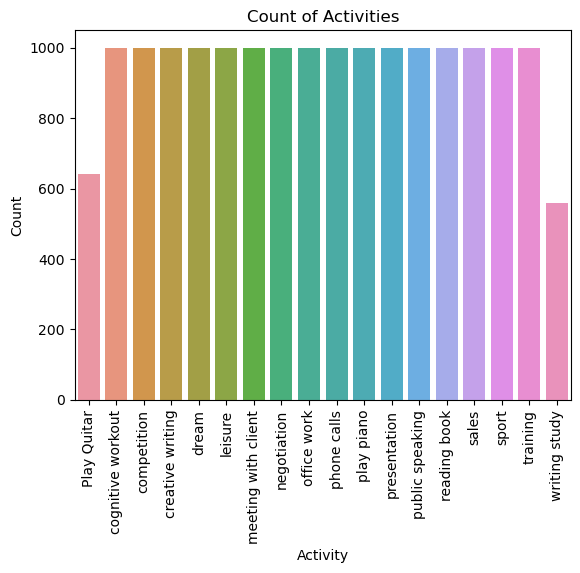

In [93]:
plt.title('No of Datapoints per Activity', fontsize=15)
sns.countplot(data=subdataframe, x='Activities Detailed')
plt.title('Count of Activities')
plt.xlabel('Activity')
plt.ylabel('Count')
plt.xticks(rotation=90)  
plt.show()

In [11]:
X_pre_tsne = subdataframe.drop('Activities Detailed', axis=1)
y_pre_tsne = subdataframe['Activities Detailed']

**Make sure data is normalized before running t-sne**

In [12]:
def feature_normalize(dataset):
    mu = np.mean(dataset,axis = 0)
    sigma = np.std(dataset,axis = 0)
    return (dataset - mu)/sigma

In [13]:
X_pre_tsne = feature_normalize(X_pre_tsne)

In [14]:
X_pre_tsne.sample()

,HR,BR,Posture,Activity,PeakAcceleration,BRAmplitude,ECGAmplitude,ECGNoise,HRConfidence,HRV,...,WalkSteps,RunSteps,Bounds,MinorImpacts,MajorImpacts,AvForceDevRate,AvStepImpulse,AvStepPeriod,PeakAccelPhi,peakAccelTheta
11905,1.353592,-1.182697,0.044522,-0.289255,-0.242279,-0.114102,0.985223,-0.101481,0.314915,-0.61625,...,-0.24312,-0.044002,-0.220581,0.900052,-0.081683,-0.234538,-0.271216,-0.270394,0.716147,0.458082


In [79]:
perplexity, n_iter = 20,1000

In [15]:
colors = sns.color_palette('tab20', n_colors=18)  # Choose a larger color palette

In [16]:
perplexity, n_iter = 20,1000
X_reduced = TSNE(verbose=2, perplexity=perplexity).fit_transform(X_pre_tsne)

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 17200 samples in 0.003s...
[t-SNE] Computed neighbors for 17200 samples in 0.726s...
[t-SNE] Computed conditional probabilities for sample 1000 / 17200
[t-SNE] Computed conditional probabilities for sample 2000 / 17200
[t-SNE] Computed conditional probabilities for sample 3000 / 17200
[t-SNE] Computed conditional probabilities for sample 4000 / 17200
[t-SNE] Computed conditional probabilities for sample 5000 / 17200
[t-SNE] Computed conditional probabilities for sample 6000 / 17200
[t-SNE] Computed conditional probabilities for sample 7000 / 17200
[t-SNE] Computed conditional probabilities for sample 8000 / 17200
[t-SNE] Computed conditional probabilities for sample 9000 / 17200
[t-SNE] Computed conditional probabilities for sample 10000 / 17200
[t-SNE] Computed conditional probabilities for sample 11000 / 17200
[t-SNE] Computed conditional probabilities for sample 12000 / 17200
[t-SNE] Computed conditional probabilities for sam

Creating plot for this t-SNE visualization..


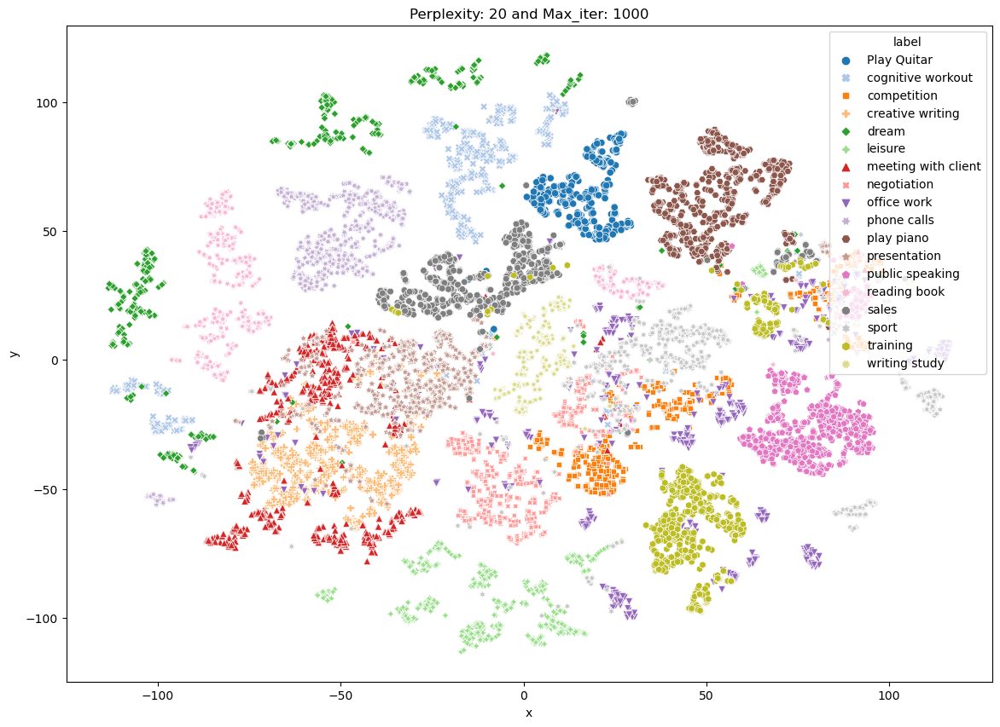

In [19]:
# Prepare the data for seaborn
print('Creating plot for this t-SNE visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_pre_tsne})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("Perplexity: {} and Max_iter: {}".format(perplexity, n_iter))
plt.show()

In [20]:
y_pre_tsne

0          Play Quitar
1          Play Quitar
2          Play Quitar
3          Play Quitar
4          Play Quitar
             ...      
17195    writing study
17196    writing study
17197    writing study
17198    writing study
17199    writing study
Name: Activities Detailed, Length: 17200, dtype: object

In [21]:
X = df[['x', 'y']].values

In [22]:
from sklearn.metrics import pairwise_distances_argmin_min

In [23]:
num_clusters = 5  # You can adjust this based on your data
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
cluster_labels = kmeans.labels_
df['cluster'] = cluster_labels

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [24]:
labels

NameError: name 'labels' is not defined

In [26]:
df

,x,y,label,color,cluster
0,26.192490,85.047165,Play Quitar,"(0.12156862745098039, 0.4666666666666667, 0.70...",1
1,19.133595,78.623955,Play Quitar,"(0.12156862745098039, 0.4666666666666667, 0.70...",1
2,19.763491,66.152100,Play Quitar,"(0.12156862745098039, 0.4666666666666667, 0.70...",1
3,18.963100,56.995026,Play Quitar,"(0.12156862745098039, 0.4666666666666667, 0.70...",1
4,25.539228,85.976646,Play Quitar,"(0.12156862745098039, 0.4666666666666667, 0.70...",1
...,...,...,...,...,...
17195,-0.626951,-5.600634,writing study,"(0.8588235294117647, 0.8588235294117647, 0.552...",4
17196,-1.167570,-14.428905,writing study,"(0.8588235294117647, 0.8588235294117647, 0.552...",4
17197,5.408055,6.505906,writing study,"(0.8588235294117647, 0.8588235294117647, 0.552...",1
17198,9.554955,24.374281,writing study,"(0.8588235294117647, 0.8588235294117647, 0.552...",1


In [25]:
X

array([[ 26.19249  ,  85.047165 ],
       [ 19.133595 ,  78.623955 ],
       [ 19.76349  ,  66.1521   ],
       ...,
       [  5.4080553,   6.505906 ],
       [  9.5549555,  24.37428  ],
       [ 23.592005 , -17.910292 ]], dtype=float32)

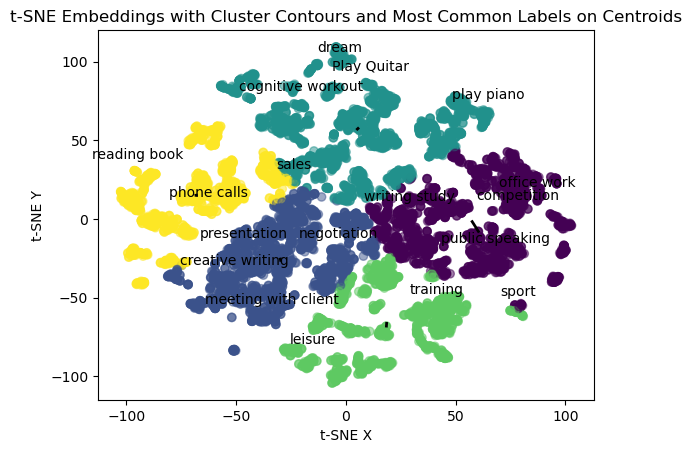

In [78]:
# Create a scatter plot of the t-SNE embeddings with labels
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='viridis', alpha=0.5)

# Draw contours between clusters
centers = kmeans.cluster_centers_

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = set(labels)
for label in unique_labels:
    label_indices = np.where(labels == label)[0]  # Find indices of data points with this label
    
    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])
    
    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)
    
    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()

# Iterate through data points and display the label only if it's in the most common cluster
for i, label in enumerate(labels):
    cluster = cluster_labels[i]
    if cluster == label_most_common_cluster[label] and label not in displayed_labels:
        plt.annotate(label, (df['x'][i], df['y'][i]), textcoords="offset points", xytext=(0, 10), ha='center')
        displayed_labels.add(label)

for i in range(num_clusters):
    cluster_points = X[cluster_labels == i]
    closest_center = pairwise_distances_argmin_min(centers[i].reshape(1, -1), cluster_points)
    closest_point_idx = closest_center[0][0]
    closest_point = cluster_points[closest_point_idx]
    
    plt.plot([centers[i][0], closest_point[0]], [centers[i][1], closest_point[1]], 'k-', linewidth=2)

plt.xlabel('t-SNE X')
plt.ylabel('t-SNE Y')
plt.title('t-SNE Embeddings with Cluster Contours and Most Common Labels on Centroids')
plt.show()

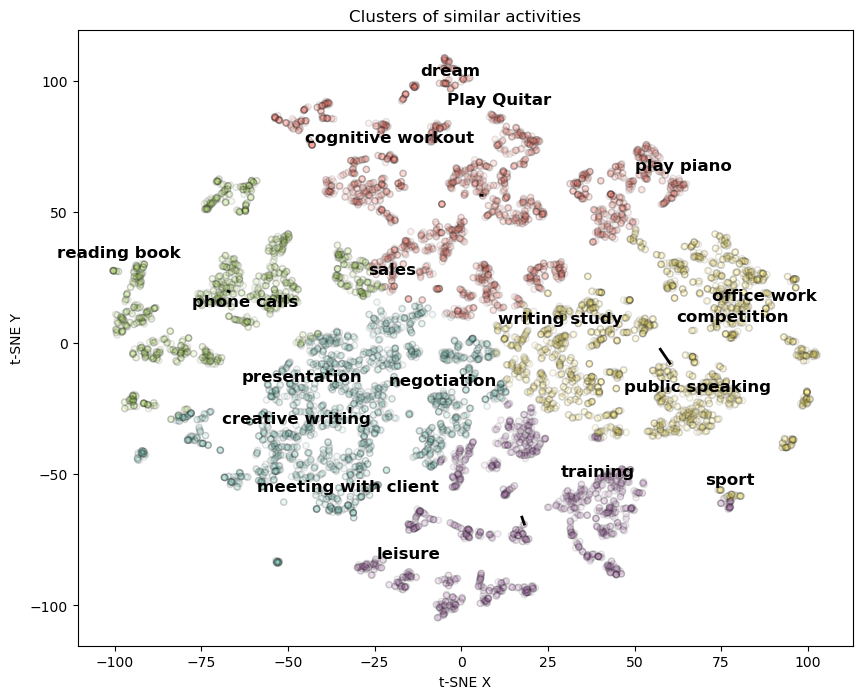

In [89]:
# Create a scatter plot of the t-SNE embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')

# Draw contours between clusters
centers = kmeans.cluster_centers_

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()

# Iterate through data points and display the label only if it's in the most common cluster
for i, label in enumerate(df['label']):
    cluster = cluster_labels[i]
    if cluster == label_most_common_cluster[label] and label not in displayed_labels:
        plt.annotate(label, (df['x'][i], df['y'][i]), textcoords="offset points", xytext=(0, 10), ha='center',
                     fontsize=12, fontweight='bold')
        displayed_labels.add(label)

for i in range(num_clusters):
    cluster_points = X[cluster_labels == i]
    closest_center = pairwise_distances_argmin_min(centers[i].reshape(1, -1), cluster_points)
    closest_point_idx = closest_center[0][0]
    closest_point = cluster_points[closest_point_idx]

    plt.plot([centers[i][0], closest_point[0]], [centers[i][1], closest_point[1]], 'k-', linewidth=2)

plt.xlabel('t-SNE X')
plt.ylabel('t-SNE Y')
plt.title('Clusters of similar activities')
plt.show()

In [104]:
num_clusters

5

In [106]:
cluster_labels

array([3, 2, 2, ..., 9, 7, 4])

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\david\anaconda3\lib\site-packages\sklearn\clust

The optimal number of clusters is: 10


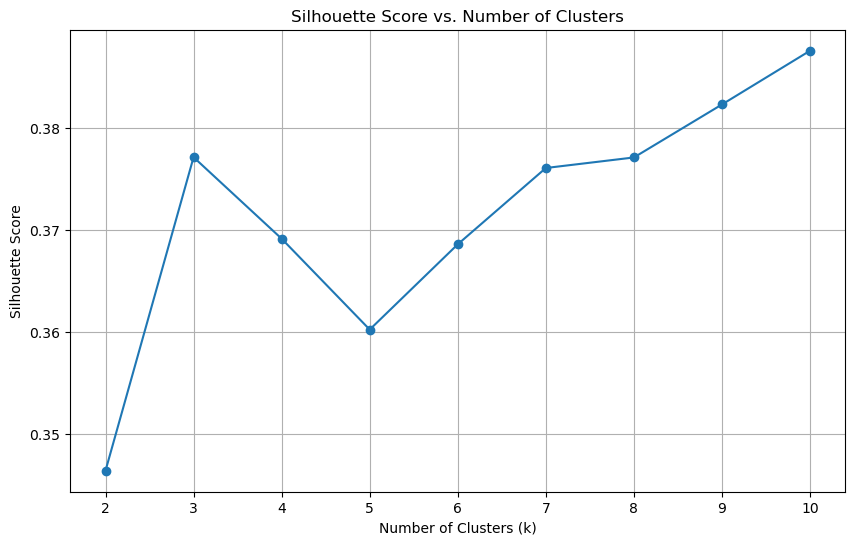

In [102]:
# Extract the t-SNE embeddings
X = df[['x', 'y']].values

# Initialize lists to store Silhouette Scores
silhouette_scores = []

# Define a range of k values to test
k_range = range(2, 11)  # You can adjust the range as needed

# Calculate Silhouette Score for each k
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=0)
    cluster_labels = kmeans.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)

# Plot the Silhouette Scores for different values of k
plt.figure(figsize=(10, 6))
plt.plot(k_range, silhouette_scores, marker='o', linestyle='-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.grid(True)

# Find the k with the highest Silhouette Score
best_k = k_range[np.argmax(silhouette_scores)]
print(f'The optimal number of clusters is: {best_k}')

plt.show()

In [120]:

# Create a table to display clusters and labels
cluster_table = pd.DataFrame(columns=['Cluster', 'Labels'])
for i in range(num_clusters):
    cluster_labels_list = []
    for label, cluster in label_most_common_cluster.items():
        if cluster == i:
            cluster_labels_list.append(label)
    cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)

# Set the index to the 'Cluster' column and add 1 to the 'Cluster' values
cluster_table.index = cluster_table['Cluster']
cluster_table['Cluster'] = cluster_table.index + 1

# Adjust the display width to prevent label text from being cut
pd.set_option('display.max_colwidth', None)

# Display the table
print(cluster_table)
plt.show()


         Cluster  \
Cluster            
1              2   
2              3   
3              4   
4              5   
5              6   

                                                                   Labels  
Cluster                                                                    
1        meeting with client, creative writing, presentation, negotiation  
2         competition, public speaking, writing study, office work, sport  
3                                               phone calls, reading book  
4                Play Quitar, play piano, cognitive workout, dream, sales  
5                                                       training, leisure  


C:\Users\david\AppData\Local\Temp\ipykernel_8804\227788497.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)
C:\Users\david\AppData\Local\Temp\ipykernel_8804\227788497.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)
C:\Users\david\AppData\Local\Temp\ipykernel_8804\227788497.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  cluster_table = cluster_table.append({'Cluster': i + 1, 'Labels': ', '.join(cluster_labels_list)}, ignore_index=True)
C:\Users\david\AppData\Local\Temp\ipykernel_88

In [126]:
import seaborn as sns

def perform_tsne(X_data, y_data, perplexities, n_iter=1000, img_name_prefix='t-sne'):
    colors = sns.color_palette('tab20', n_colors=20)  # Choose a larger color palette

    for index, perplexity in enumerate(perplexities):
        # Perform t-SNE
        print('\nPerforming t-SNE with perplexity {} and {} iterations at max'.format(perplexity, n_iter))
        X_reduced = TSNE(verbose=2, perplexity=perplexity).fit_transform(X_data)
        print('Done..')

        # Prepare the data for seaborn
        print('Creating plot for this t-SNE visualization..')
        df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_data})

        # Get the unique levels in the 'label' column
        unique_labels = df['label'].unique()

        # Create a dictionary mapping each level to a color
        color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

        # Map the colors to the 'label' column
        df['color'] = df['label'].map(color_dict)

        # Draw the plot
        plt.figure(figsize=(14, 10))
        sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
        plt.title("Perplexity: {} and Max_iter: {}".format(perplexity, n_iter))
        img_name = img_name_prefix + '_perp_{}_iter_{}.png'.format(perplexity, n_iter)
        print('Saving this plot as an image in the present working directory...')
        plt.savefig(img_name)
        plt.show()
        print('Done')


Performing t-SNE with perplexity 2 and 1000 iterations at max
[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 9372 samples in 0.004s...


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 9372 samples in 0.807s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9372
[t-SNE] Computed conditional probabilities for sample 2000 / 9372
[t-SNE] Computed conditional probabilities for sample 3000 / 9372
[t-SNE] Computed conditional probabilities for sample 4000 / 9372
[t-SNE] Computed conditional probabilities for sample 5000 / 9372
[t-SNE] Computed conditional probabilities for sample 6000 / 9372
[t-SNE] Computed conditional probabilities for sample 7000 / 9372
[t-SNE] Computed conditional probabilities for sample 8000 / 9372
[t-SNE] Computed conditional probabilities for sample 9000 / 9372
[t-SNE] Computed conditional probabilities for sample 9372 / 9372
[t-SNE] Mean sigma: 0.097846
[t-SNE] Computed conditional probabilities in 0.084s
[t-SNE] Iteration 50: error = 127.1382751, gradient norm = 0.0264003 (50 iterations in 7.258s)
[t-SNE] Iteration 100: error = 107.6990204, gradient norm = 0.0208954 (50 iterations in 4.782s)
[t-SNE] It

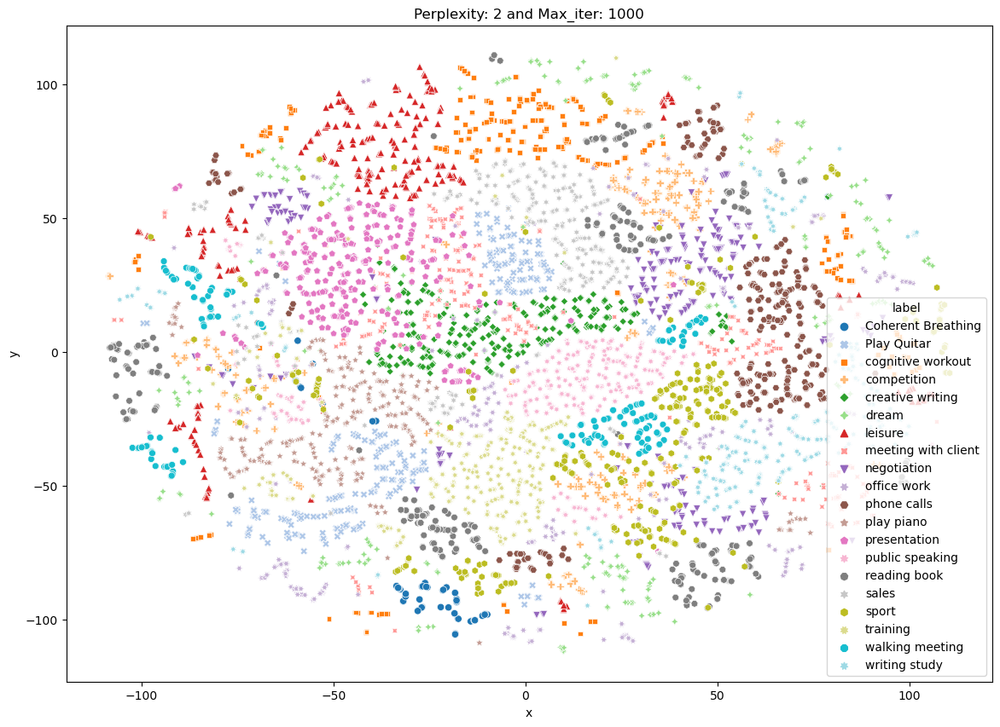

Done

Performing t-SNE with perplexity 5 and 1000 iterations at max
[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 9372 samples in 0.004s...


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 9372 samples in 0.824s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9372
[t-SNE] Computed conditional probabilities for sample 2000 / 9372
[t-SNE] Computed conditional probabilities for sample 3000 / 9372
[t-SNE] Computed conditional probabilities for sample 4000 / 9372
[t-SNE] Computed conditional probabilities for sample 5000 / 9372
[t-SNE] Computed conditional probabilities for sample 6000 / 9372
[t-SNE] Computed conditional probabilities for sample 7000 / 9372
[t-SNE] Computed conditional probabilities for sample 8000 / 9372
[t-SNE] Computed conditional probabilities for sample 9000 / 9372
[t-SNE] Computed conditional probabilities for sample 9372 / 9372
[t-SNE] Mean sigma: 0.188939
[t-SNE] Computed conditional probabilities in 0.185s
[t-SNE] Iteration 50: error = 116.4063110, gradient norm = 0.0216218 (50 iterations in 10.201s)
[t-SNE] Iteration 100: error = 96.2781677, gradient norm = 0.0111612 (50 iterations in 5.890s)
[t-SNE] It

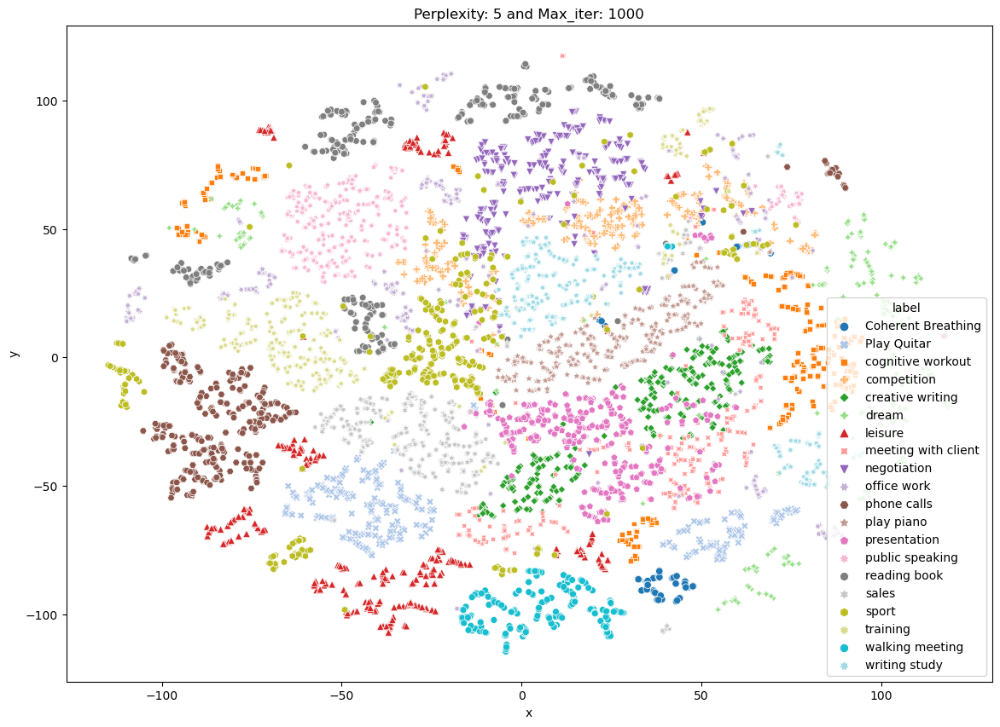

Done

Performing t-SNE with perplexity 10 and 1000 iterations at max
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 9372 samples in 0.004s...


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computed neighbors for 9372 samples in 0.981s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9372
[t-SNE] Computed conditional probabilities for sample 2000 / 9372
[t-SNE] Computed conditional probabilities for sample 3000 / 9372
[t-SNE] Computed conditional probabilities for sample 4000 / 9372
[t-SNE] Computed conditional probabilities for sample 5000 / 9372
[t-SNE] Computed conditional probabilities for sample 6000 / 9372
[t-SNE] Computed conditional probabilities for sample 7000 / 9372
[t-SNE] Computed conditional probabilities for sample 8000 / 9372
[t-SNE] Computed conditional probabilities for sample 9000 / 9372
[t-SNE] Computed conditional probabilities for sample 9372 / 9372
[t-SNE] Mean sigma: 0.250883
[t-SNE] Computed conditional probabilities in 0.282s
[t-SNE] Iteration 50: error = 107.7406616, gradient norm = 0.0208808 (50 iterations in 11.458s)
[t-SNE] Iteration 100: error = 87.8345795, gradient norm = 0.0082843 (50 iterations in 5.572s)
[t-SNE] It

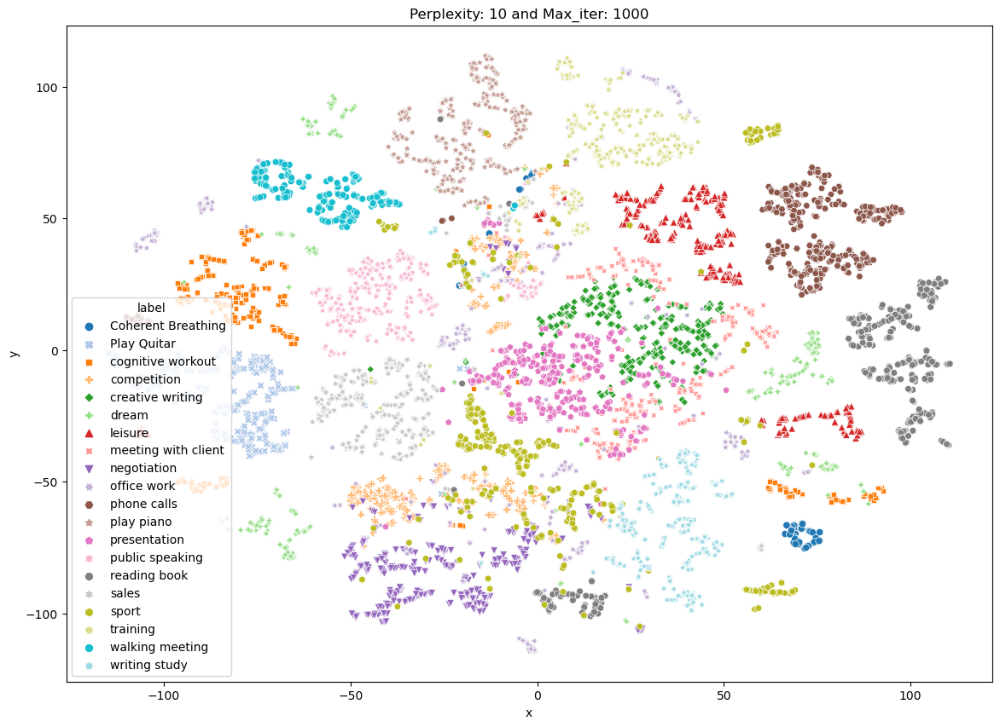

Done


In [127]:
perform_tsne(X_data = X_pre_tsne,y_data=y_pre_tsne, perplexities =[2,5,10])

From the results obtained we can observe that following labels exhibit similarities:

1. Meeting with client, presentation, creative writing

2. Phone calls, leisure, reading book, dream

3. Sport, competition 

4. Training, sport, 

5. Public speaking - office work - walking meeting

6. Cognitive workout, play quitar




Furthermore, we can conclude that it is likely harder to distinguish between labels on one side - sport and competition, and on the other side training and sport

Similarly the labels meeting with client, presentation, creative writing are interesecting for many instances. 

Smaller labels like play piano, coherent breathing are relatively independent from all others. 

As a next we can use k-means clustering to have the computer assign the labels into clusters

## UMAP

In [41]:
import umap

In [60]:
from sklearn.metrics import pairwise_distances_argmin_min

UMAP(min_dist=0.3, n_neighbors=40, verbose=True)
Wed Sep  6 23:27:25 2023 Construct fuzzy simplicial set
Wed Sep  6 23:27:25 2023 Finding Nearest Neighbors
Wed Sep  6 23:27:25 2023 Building RP forest with 12 trees
Wed Sep  6 23:27:25 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	Stopping threshold met -- exiting after 2 iterations
Wed Sep  6 23:27:27 2023 Finished Nearest Neighbor Search
Wed Sep  6 23:27:27 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Wed Sep  6 23:27:38 2023 Finished embedding
Creating plot for this UMAP visualization..


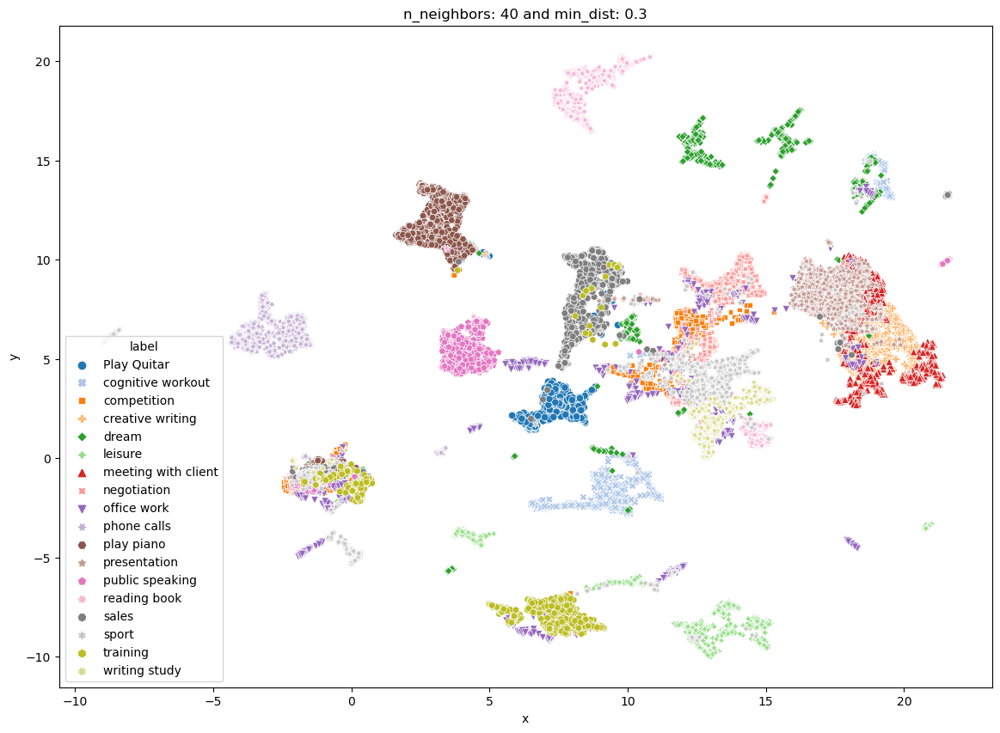

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


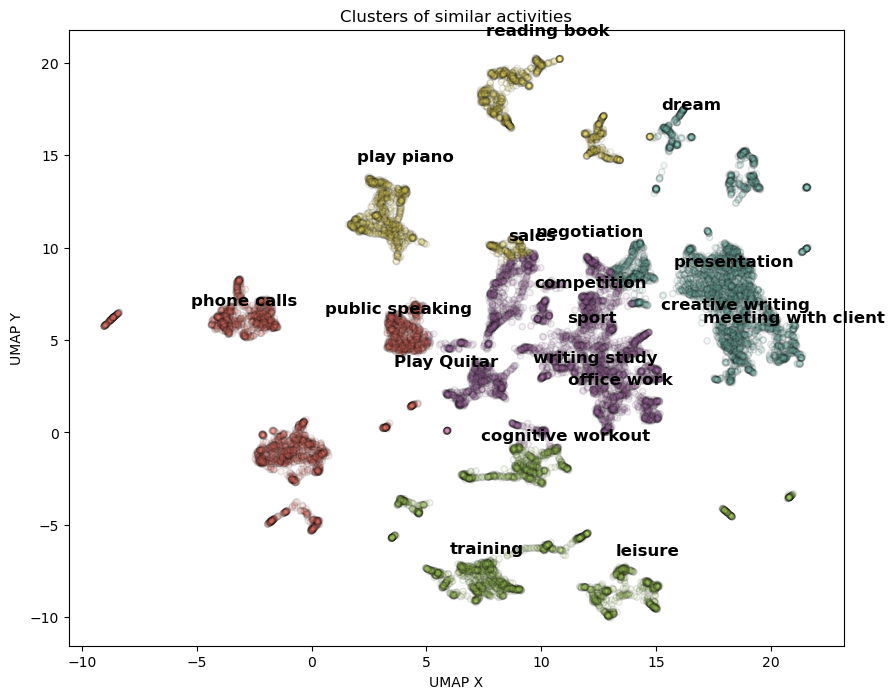

In [100]:
colors = sns.color_palette('tab20', n_colors=18)  # Choose a larger color palette
n_neighbors = 40  # Adjust this parameter based on your data
min_dist = 0.3  # Adjust this parameter based on your data
umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, verbose=True)
X_reduced = umap_model.fit_transform(X_pre_tsne)

# Prepare the data for seaborn
print('Creating plot for this UMAP visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_pre_tsne})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("n_neighbors: {} and min_dist: {}".format(n_neighbors, min_dist))
plt.show()


X = df[['x', 'y']].values

num_clusters = 5  # You can adjust this based on your data
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
cluster_labels = kmeans.labels_
df['cluster'] = cluster_labels

# Create a scatter plot of the UMAP embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()

# Iterate through data points and display the label only if it's in the most common cluster
for i, label in enumerate(df['label']):
    cluster = cluster_labels[i]
    if cluster == label_most_common_cluster[label] and label not in displayed_labels:
        plt.annotate(label, (df['x'][i], df['y'][i]), textcoords="offset points", xytext=(0, 20), ha='center',
                     fontsize=12, fontweight='bold')
        displayed_labels.add(label)

plt.xlabel('UMAP X')
plt.ylabel('UMAP Y')
plt.title('Clusters of similar activities')
plt.show()

UMAP(n_neighbors=10, verbose=True)
Wed Sep  6 23:43:05 2023 Construct fuzzy simplicial set
Wed Sep  6 23:43:05 2023 Finding Nearest Neighbors
Wed Sep  6 23:43:05 2023 Building RP forest with 31 trees
Wed Sep  6 23:43:10 2023 NN descent for 18 iterations
	 1  /  18
	 2  /  18
	Stopping threshold met -- exiting after 2 iterations
Wed Sep  6 23:43:14 2023 Finished Nearest Neighbor Search
Wed Sep  6 23:43:15 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Thu Sep  7 00:01:25 2023 Finished embedding
Creating plot for this UMAP visualization..


C:\Users\david\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


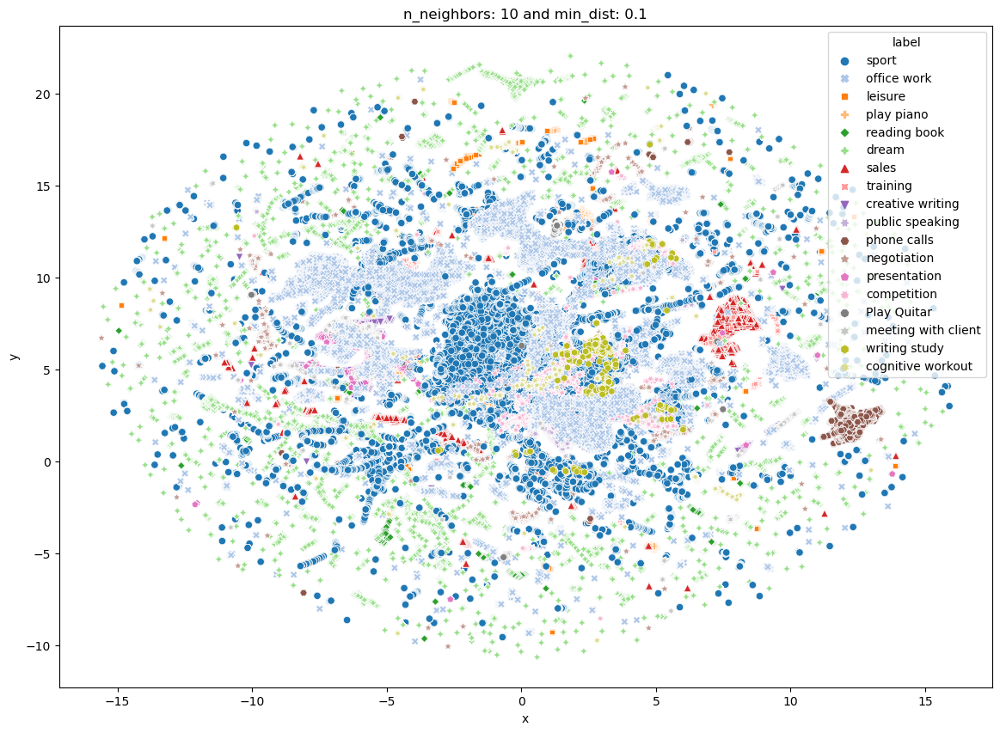

C:\Users\david\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


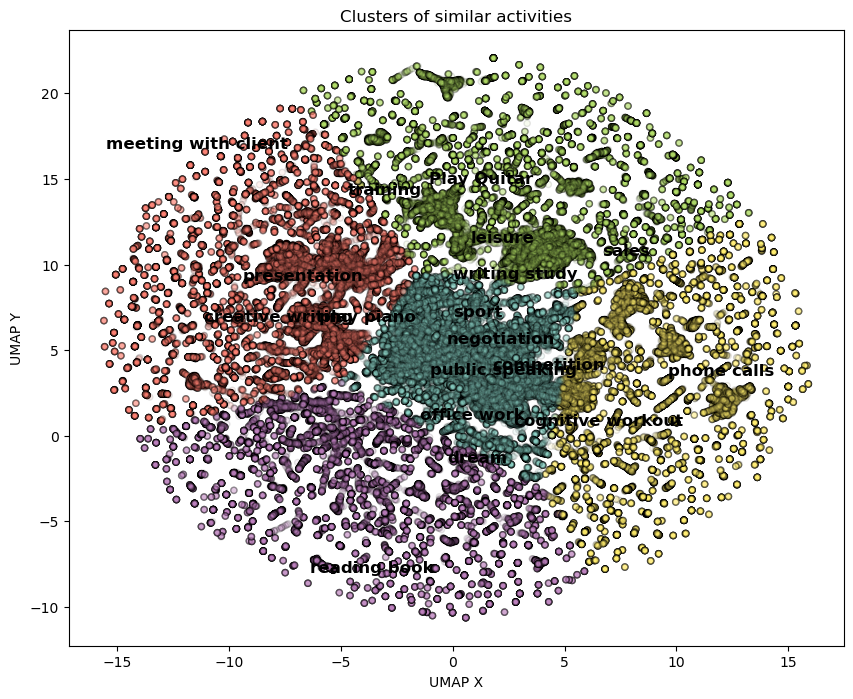

In [107]:
colors = sns.color_palette('tab20', n_colors=18)  # Choose a larger color palette
n_neighbors = 10  # Adjust this parameter based on your data
min_dist = 0.1  # Adjust this parameter based on your data
umap_model = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, verbose=True)
X_reduced = umap_model.fit_transform(X_all)

# Prepare the data for seaborn
print('Creating plot for this UMAP visualization..')
df = pd.DataFrame({'x': X_reduced[:, 0], 'y': X_reduced[:, 1], 'label': y_all})

# Get the unique levels in the 'label' column
unique_labels = df['label'].unique()

# Create a dictionary mapping each level to a color
color_dict = dict(zip(unique_labels, colors[:len(unique_labels)]))

# Map the colors to the 'label' column
df['color'] = df['label'].map(color_dict)

# Draw the plot
plt.figure(figsize=(14, 10))
sns.scatterplot(data=df, x='x', y='y', hue='label', style='label', palette=color_dict, markers=True)
plt.title("n_neighbors: {} and min_dist: {}".format(n_neighbors, min_dist))
plt.show()


X = df[['x', 'y']].values

num_clusters = 5  # You can adjust this based on your data
kmeans = KMeans(n_clusters=num_clusters)
kmeans.fit(X)
cluster_labels = kmeans.labels_
df['cluster'] = cluster_labels

# Create a scatter plot of the UMAP embeddings with labels
plt.figure(figsize=(10, 8))
scatter = plt.scatter(df['x'], df['y'], c=cluster_labels, cmap='Set3', alpha=0.1, s=20, edgecolor='k')

# Create a dictionary to store the cluster with the most occurrences for each label
label_most_common_cluster = {}

# Iterate through unique labels
unique_labels = df['label'].unique()
for label in unique_labels:
    label_indices = np.where(df['label'] == label)[0]  # Find indices of data points with this label

    # Count occurrences of this label in each cluster
    label_counts_in_clusters = np.bincount(cluster_labels[label_indices])

    # Find the cluster with the most occurrences of this label
    most_common_cluster = np.argmax(label_counts_in_clusters)

    # Store the most common cluster for this label
    label_most_common_cluster[label] = most_common_cluster

# Create a set to keep track of displayed labels
displayed_labels = set()

# Iterate through data points and display the label only if it's in the most common cluster
for i, label in enumerate(df['label']):
    cluster = cluster_labels[i]
    if cluster == label_most_common_cluster[label] and label not in displayed_labels:
        plt.annotate(label, (df['x'][i], df['y'][i]), textcoords="offset points", xytext=(0, 20), ha='center',
                     fontsize=12, fontweight='bold')
        displayed_labels.add(label)

plt.xlabel('UMAP X')
plt.ylabel('UMAP Y')
plt.title('Clusters of similar activities')
plt.show()

## Now t-sne with all data

In [101]:
columns_to_exclude = ['Year','Month', 'Weekday', 'Hour', 'Date','Activities','Name of the volunteer', 
                      'PeakAcceleration','HRConfidence','AvForceDevRate','AvStepImpulse','WalkSteps','RunSteps','Bounds',
                      'CoreTemp', 'MinorImpacts', 'MajorImpacts']
numerical_columns  = data.drop(columns=columns_to_exclude)

# Get the numeric columns including "Activities Detailed" column
numeric_columns = numerical_columns.select_dtypes(include=[np.number, "object"])

non_binary_columns_tsne = numerical_columns.loc[:, ~(numerical_columns.isin([0, 1])).all()]  # Exclude columns with only 0s and 1s
# Exclude these columns as they don't provide important information

In [105]:
X_all = non_binary_columns_tsne.drop('Activities Detailed', axis=1)
X_all = feature_normalize(X_all)
y_all = non_binary_columns['Activities Detailed']

In [103]:
non_binary_columns_nona = non_binary_columns.dropna()

In [104]:
non_binary_columns.shape

(269566, 23)

In [569]:
X_all = non_binary_columns.drop('Date', axis=1)


Performing t-SNE with perplexity 10 and 1000 iterations at max
[t-SNE] Computing 31 nearest neighbors...


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Indexed 268366 samples in 3.358s...
[t-SNE] Computed neighbors for 268366 samples in 329.449s...
[t-SNE] Computed conditional probabilities for sample 1000 / 268366
[t-SNE] Computed conditional probabilities for sample 2000 / 268366
[t-SNE] Computed conditional probabilities for sample 3000 / 268366
[t-SNE] Computed conditional probabilities for sample 4000 / 268366
[t-SNE] Computed conditional probabilities for sample 5000 / 268366
[t-SNE] Computed conditional probabilities for sample 6000 / 268366
[t-SNE] Computed conditional probabilities for sample 7000 / 268366
[t-SNE] Computed conditional probabilities for sample 8000 / 268366
[t-SNE] Computed conditional probabilities for sample 9000 / 268366
[t-SNE] Computed conditional probabilities for sample 10000 / 268366
[t-SNE] Computed conditional probabilities for sample 11000 / 268366
[t-SNE] Computed conditional probabilities for sample 12000 / 268366
[t-SNE] Computed conditional probabilities for sample 13000 / 268366
[t-SNE]

[t-SNE] Computed conditional probabilities for sample 125000 / 268366
[t-SNE] Computed conditional probabilities for sample 126000 / 268366
[t-SNE] Computed conditional probabilities for sample 127000 / 268366
[t-SNE] Computed conditional probabilities for sample 128000 / 268366
[t-SNE] Computed conditional probabilities for sample 129000 / 268366
[t-SNE] Computed conditional probabilities for sample 130000 / 268366
[t-SNE] Computed conditional probabilities for sample 131000 / 268366
[t-SNE] Computed conditional probabilities for sample 132000 / 268366
[t-SNE] Computed conditional probabilities for sample 133000 / 268366
[t-SNE] Computed conditional probabilities for sample 134000 / 268366
[t-SNE] Computed conditional probabilities for sample 135000 / 268366
[t-SNE] Computed conditional probabilities for sample 136000 / 268366
[t-SNE] Computed conditional probabilities for sample 137000 / 268366
[t-SNE] Computed conditional probabilities for sample 138000 / 268366
[t-SNE] Computed con

[t-SNE] Computed conditional probabilities for sample 254000 / 268366
[t-SNE] Computed conditional probabilities for sample 255000 / 268366
[t-SNE] Computed conditional probabilities for sample 256000 / 268366
[t-SNE] Computed conditional probabilities for sample 257000 / 268366
[t-SNE] Computed conditional probabilities for sample 258000 / 268366
[t-SNE] Computed conditional probabilities for sample 259000 / 268366
[t-SNE] Computed conditional probabilities for sample 260000 / 268366
[t-SNE] Computed conditional probabilities for sample 261000 / 268366
[t-SNE] Computed conditional probabilities for sample 262000 / 268366
[t-SNE] Computed conditional probabilities for sample 263000 / 268366
[t-SNE] Computed conditional probabilities for sample 264000 / 268366
[t-SNE] Computed conditional probabilities for sample 265000 / 268366
[t-SNE] Computed conditional probabilities for sample 266000 / 268366
[t-SNE] Computed conditional probabilities for sample 267000 / 268366
[t-SNE] Computed con

C:\Users\DavidovB\AppData\Local\Temp\ipykernel_104\2555166826.py:45: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(img_name)
C:\Users\DavidovB\anaconda3\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


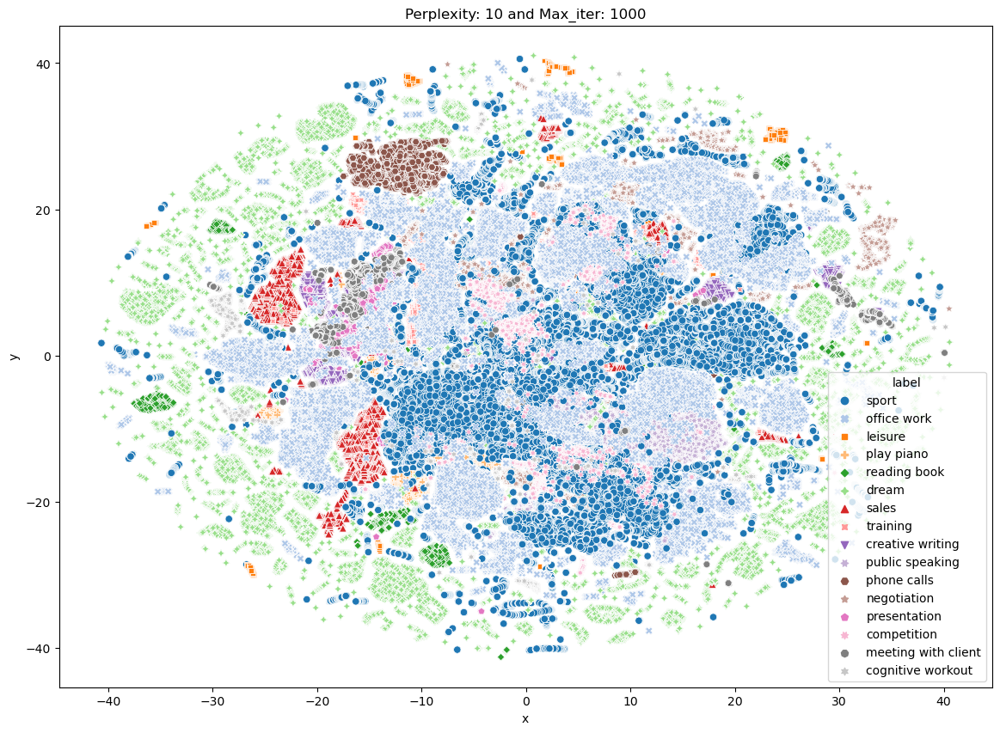

Done
Saving this K-Means clustering plot as an image in the present working directory...


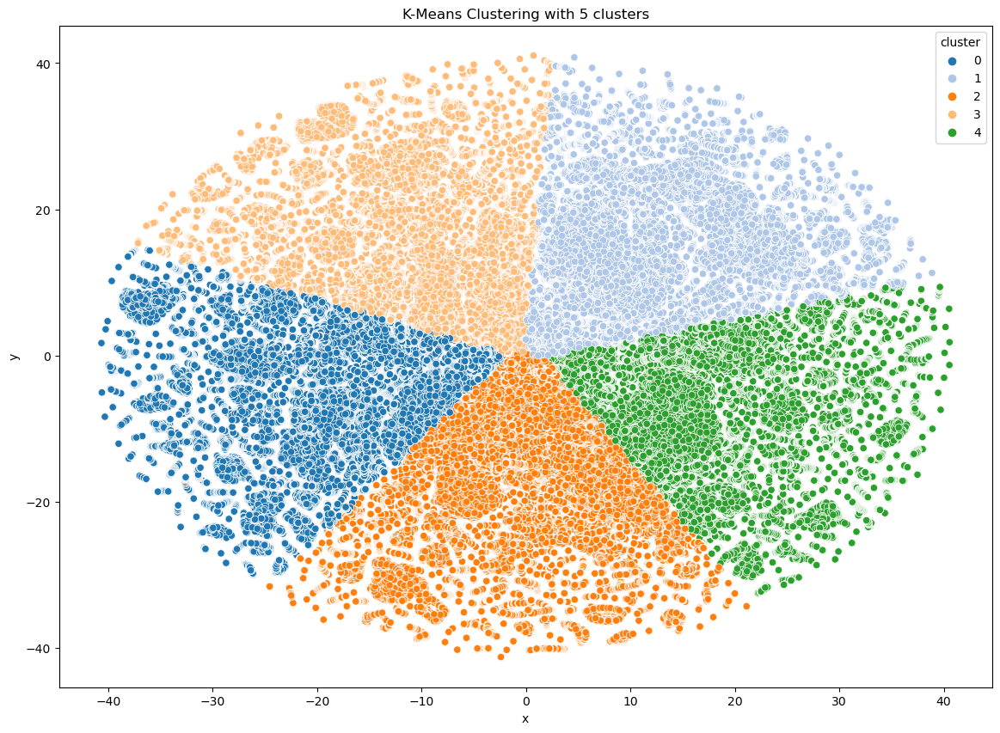

Done
Cluster 0: dream, sales, creative writing, cognitive workout
Cluster 1: office work, leisure, negotiation
Cluster 2: sport, play piano, reading book, competition
Cluster 3: training, phone calls, presentation, meeting with client
Cluster 4: public speaking
Saving this K-Means clustering plot as an image in the present working directory...


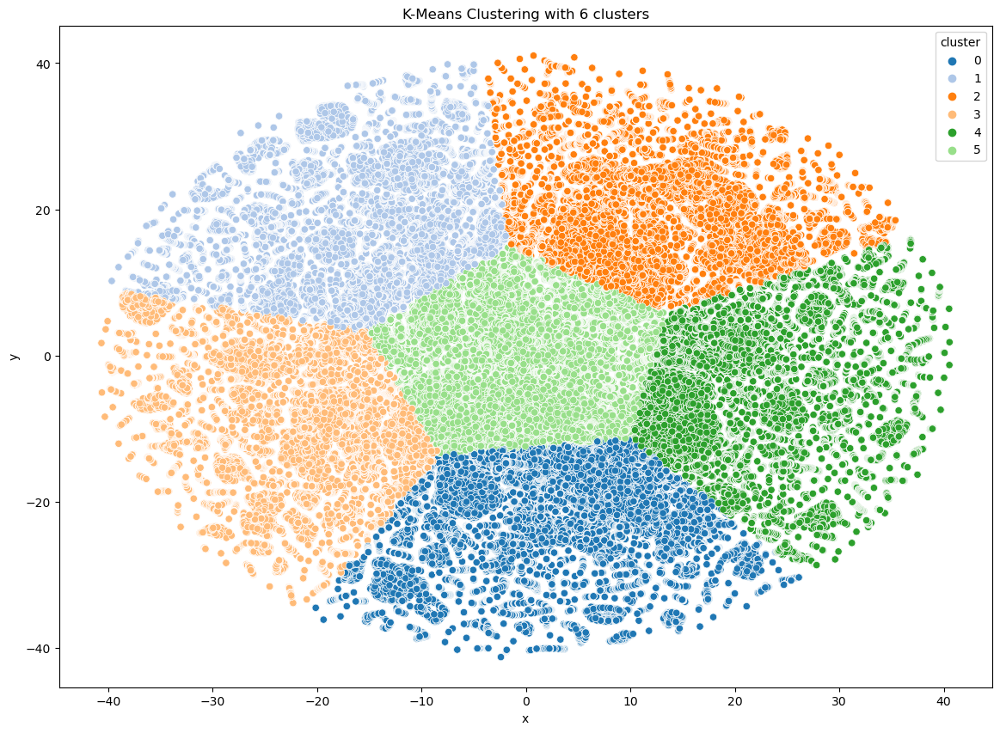

Done
Cluster 0: reading book
Cluster 1: training, creative writing, phone calls, presentation, meeting with client
Cluster 2: office work, leisure, negotiation
Cluster 3: play piano, dream, sales, cognitive workout
Cluster 4: public speaking
Cluster 5: sport, competition
Saving this K-Means clustering plot as an image in the present working directory...


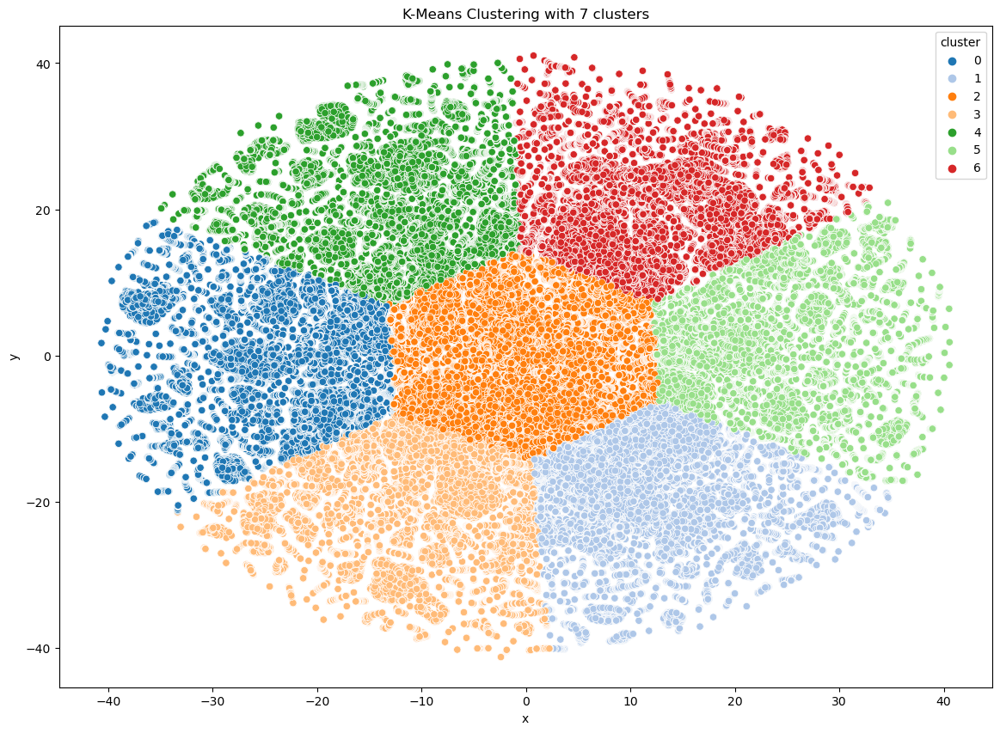

Done
Cluster 0: dream, sales, creative writing, presentation, cognitive workout
Cluster 1: public speaking
Cluster 2: sport, competition
Cluster 3: play piano, reading book
Cluster 4: training, phone calls, meeting with client
Cluster 5: 
Cluster 6: office work, leisure, negotiation


In [575]:
perform_tsne_with_kmeans(X_data = X_all, y_data = y_all, perplexities=[10], n_clusters_range=[5, 6, 7])

## Group by activity

## Partitions

In [26]:
#choose only numerical data for correlation
columns_to_exclude = ['Year','Month', 'Weekday', 'Hour', 'Activities','Name of the volunteer', 
                      'PeakAcceleration','HRConfidence','AvForceDevRate','AvStepImpulse','WalkSteps','RunSteps','Bounds',
                      'CoreTemp', 'MinorImpacts', 'MajorImpacts']
numerical_columns  = data.drop(columns=columns_to_exclude)
numeric_columns = numerical_columns.select_dtypes(include=[np.number, "object"])
non_binary_columns = numerical_columns.loc[:, ~(numerical_columns.isin([0, 1])).all()]  # Exclude columns with only 0s and 1s
# Exclude these columns as they don't provide important information
#columns_to_exclude = ['Year', 'Hour']

In [27]:
non_binary_columns.columns

Index(['HR', 'BR', 'Posture', 'Activity', 'BRAmplitude', 'ECGAmplitude',
       'ECGNoise', 'HRV', 'ImpulseLoad', 'Date', 'AvStepPeriod',
       'PeakAccelPhi', 'peakAccelTheta', 'Activities Detailed'],
      dtype='object')

In [28]:
def select_random_rows_per_label(df, label_column, n=500, random_state=42):
    # Group the DataFrame by the specified 'label_column'
    grouped = df.groupby(label_column)

    # Create an empty DataFrame to store the subdataframe
    subdataframe = pd.DataFrame()

    # Iterate over each group
    for label, group_df in grouped:
        # Get the number of available rows for the current label
        available_rows = len(group_df)

        # Calculate the number of rows to sample (min between 'n' and available rows)
        rows_to_sample = min(n, available_rows)

        # Randomly sample rows from the current group
        random_rows = group_df.sample(rows_to_sample, replace=rows_to_sample > available_rows, random_state=random_state)

        # Replicate rows if necessary
        if rows_to_sample > available_rows:
            repetitions = rows_to_sample // available_rows
            random_rows = pd.concat([random_rows] * repetitions, ignore_index=True)
            remaining_rows = rows_to_sample % available_rows
            random_rows = pd.concat([random_rows, group_df.sample(remaining_rows, random_state=random_state)],
                                   ignore_index=True)

        # Append the random rows to the subdataframe
        subdataframe = pd.concat([subdataframe, random_rows], ignore_index=True)

    # Reset the index of the subdataframe
    subdataframe = subdataframe.reset_index(drop=True)

    return subdataframe

# Example usage:
# Assuming you have a DataFrame named 'X_pre_tsne' and the label column is 'Activities Detailed'
n = 1500  # Number of random rows per label
random_subdataframe = select_random_rows_per_label(non_binary_columns, label_column='Activities Detailed', n=n)

In [46]:
X_pre_tsne

,HR,BR,Posture,Activity,BRAmplitude,ECGAmplitude,ECGNoise,HRV,ImpulseLoad,Date,AvStepPeriod,PeakAccelPhi,peakAccelTheta
0,72,18,23,0.01,4859,0.00332,0.00014,45,98,22.6.2022,0.0,158,-40
1,68,15,26,0.02,4819,0.00262,0.00034,28,35,22.6.2022,0.0,153,-47
2,74,19,23,0.01,5583,0.00332,0.00014,44,98,22.6.2022,0.0,159,-46
3,71,17,24,0.02,8474,0.00324,0.00020,26,98,22.6.2022,0.0,154,-43
4,73,19,24,0.01,5153,0.00342,0.00012,34,101,22.6.2022,0.0,158,-37
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7995,92,21,-19,0.01,6170,0.00414,0.00032,38,13578,1.4.2022,0.0,158,151
7996,88,15,-6,0.01,7501,0.00170,0.00012,37,3418,1.4.2022,0.0,171,98
7997,92,10,-15,0.03,26971,0.00464,0.00030,39,13584,1.4.2022,0.0,162,178
7998,114,26,-22,0.01,6456,0.00362,0.00016,25,13206,1.4.2022,0.0,154,180


## Prediction

In [36]:
from sklearn.model_selection import train_test_split

In [57]:
X_reduced = TSNE(verbose=2, perplexity=2).fit_transform(X_pre_tsne)

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.001s...
[t-SNE] Computed neighbors for 8000 samples in 0.335s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.098854
[t-SNE] Computed conditional probabilities in 0.031s
[t-SNE] Iteration 50: error = 118.9889374, gradient norm = 0.0624643 (50 iterations in 1.968s)
[t-SNE] Iteration 100: error = 103.3562775, gradient norm = 0.0245476 (50 iterations in 1.535s)
[t-SNE] Iteration 150: error = 97.6156464, gradient norm = 

Now let's see with random data 

In [31]:
def create_random_subdataframe(df, n):
    def sample_rows(group_df, n):
        available_rows = len(group_df)
        rows_to_sample = min(n, available_rows)
        random_rows = group_df.sample(rows_to_sample, replace=rows_to_sample > available_rows, random_state=42)

        if rows_to_sample > available_rows:
            repetitions = rows_to_sample // available_rows
            random_rows = pd.concat([random_rows] * repetitions, ignore_index=True)
            remaining_rows = rows_to_sample % available_rows
            random_rows = pd.concat([random_rows, group_df.sample(remaining_rows, random_state=42)], ignore_index=True)

        return random_rows

    numeric_columns = df.select_dtypes(exclude=[np.number])

    grouped = numeric_columns.groupby('Activities Detailed')
    subdataframe = pd.DataFrame()

    for label, group_df in grouped:
        random_rows = sample_rows(group_df, n)
        subdataframe = pd.concat([subdataframe, random_rows], ignore_index=True)

    return subdataframe.reset_index(drop=True)

In [510]:
excluded_labels = ['Play Quitar', 'writing study', 'walking meeting', 'Coherent Breathing']
non_binary_columns_predict = non_binary_columns[~non_binary_columns['Activities Detailed'].isin(excluded_labels)]

In [511]:
# Example usage:
n = 1500
subdataframe_random = create_random_subdataframe(non_binary_columns_predict, n)

In [173]:
X_tsne_random = subdataframe[['ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity']]
X_tsne_random = feature_normalize(X_pre_tsne)
y_tsne_random = subdataframe['Activities Detailed']

In [177]:
X_train, X_test, y_train, y_test = train_test_split(X_reduced, y_tsne_random, test_size=0.1, random_state=42)

# Step 3: Choose a machine learning model (e.g., Random Forest, Logistic Regression, etc.)
from sklearn.ensemble import RandomForestClassifier
# Replace RandomForestClassifier with the model of your choice

# Step 4: Train the model on the training set using the reduced features
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train, y_train)

# Step 5: Evaluate the model on the testing set
y_pred = rf_classifier.predict(X_test)

# Evaluate the model's performance
from sklearn.metrics import accuracy_score, classification_report

accuracy = accuracy_score(y_test, y_pred)
print("Random Forest Accuracy: {:.2f}%".format(accuracy * 100))
print("Classification Report:\n", classification_report(y_test, y_pred))

Random Forest Accuracy: 86.50%
Classification Report:
                      precision    recall  f1-score   support

  cognitive workout       0.95      0.95      0.95       138
        competition       0.84      0.93      0.88       142
   creative writing       0.83      0.81      0.82       167
              dream       0.96      0.92      0.94       158
            leisure       0.95      0.97      0.96       144
meeting with client       0.78      0.76      0.77       161
        negotiation       0.79      0.81      0.80       147
        office work       0.74      0.72      0.73       134
        phone calls       0.99      0.97      0.98       150
         play piano       0.88      0.91      0.89       152
       presentation       0.75      0.75      0.75       141
    public speaking       0.84      0.89      0.87       149
       reading book       0.96      0.98      0.97       151
              sales       0.79      0.82      0.81       152
              sport       0.8

## Predict with various models

In [58]:
n = 5000  # Number of random rows per label

# Group the dataframe by the 'Activities Detailed' column
grouped = non_binary_columns.groupby('Activities Detailed')

# Create an empty DataFrame to store the subdataframe
subdataframe = pd.DataFrame()

# Iterate over each group
for label, group_df in grouped:
    # Get the number of available rows for the current label
    available_rows = len(group_df)

    # Calculate the number of rows to sample (min between 'n' and available rows)
    rows_to_sample = min(n, available_rows)

    # Randomly sample rows from the current group
    random_rows = group_df.sample(rows_to_sample, replace=rows_to_sample > available_rows, random_state=42)

    # Replicate rows if necessary
    if rows_to_sample > available_rows:
        repetitions = rows_to_sample // available_rows
        random_rows = pd.concat([random_rows] * repetitions, ignore_index=True)
        remaining_rows = rows_to_sample % available_rows
        random_rows = pd.concat([random_rows, group_df.sample(remaining_rows, random_state=42)], ignore_index=True)

    # Append the random rows to the subdataframe
    subdataframe = pd.concat([subdataframe, random_rows], ignore_index=True)

# Reset the index of the subdataframe
subdataframe = subdataframe.reset_index(drop=True)

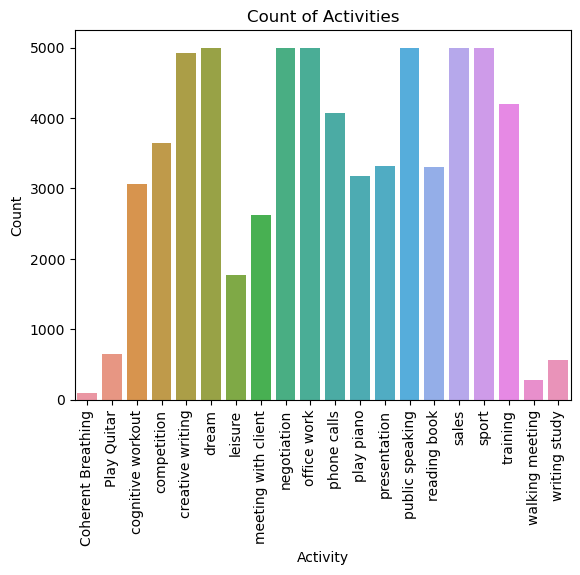

In [345]:
plt.title('No of Datapoints per Activity', fontsize=15)
sns.countplot(data=subdataframe, x='Activities Detailed')
plt.title('Count of Activities')
plt.xlabel('Activity')
plt.ylabel('Count')
plt.xticks(rotation=90)  
plt.show()

In [346]:
excluded_labels = ['Play Quitar', 'writing study', 'walking meeting', 'Coherent Breathing']
subdataframe = subdataframe[~subdataframe['Activities Detailed'].isin(excluded_labels)]

In [66]:
X = subdataframe[['ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity']]
# X = feature_normalize(X)
y = subdataframe['Activities Detailed']

# Split the data into 80% training and 20% testing
X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train_raw)

X_test = scaler.transform(X_test_raw)

print('X_train and y_train : ({},{})'.format(X_train.shape, y_train.shape))
print('X_test  and y_test  : ({},{})'.format(X_test.shape, y_test.shape))

X_train and y_train : ((51296, 6),(51296,))
X_test  and y_test  : ((12824, 6),(12824,))


In [65]:
labels=['cognitive workout', 'competition', 'creative writing', 'dream',
        'leisure', 'meeting with client', 'negotiation', 'office work',
        'phone calls', 'play piano', 'presentation', 'public speaking',
        'reading book', 'sales', 'sport','training']

In [18]:
import itertools
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
plt.rcParams["font.family"] = 'sans-serif'

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [19]:
from datetime import datetime
def perform_model(model, X_train, y_train, X_test, y_test, class_labels, cm_normalize=False, \
                 print_cm=True, cm_cmap=plt.cm.RdPu):
    
    
    # to store results at various phases
    results = dict()
    
    # time at which model starts training 
    train_start_time = datetime.now()
    print('training the model..')
    model.fit(X_train, y_train)
    print('Done \n \n')
    train_end_time = datetime.now()
    results['training_time'] =  train_end_time - train_start_time
    print('training_time(HH:MM:SS.ms) - {}\n\n'.format(results['training_time']))
    
    
    # predict test data
    print('Predicting test data')
    test_start_time = datetime.now()
    y_pred = model.predict(X_test)
    test_end_time = datetime.now()
    print('Done \n \n')
    results['testing_time'] = test_end_time - test_start_time
    print('testing time(HH:MM:SS:ms) - {}\n\n'.format(results['testing_time']))
    results['predicted'] = y_pred
   

    # calculate overall accuracty of the model
    accuracy = metrics.accuracy_score(y_true=y_test, y_pred=y_pred)
    # store accuracy in results
    results['accuracy'] = accuracy
    print('---------------------')
    print('|      Accuracy      |')
    print('---------------------')
    print('\n    {}\n\n'.format(accuracy))
    
    
    # confusion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)
    results['confusion_matrix'] = cm
    if print_cm: 
        print('--------------------')
        print('| Confusion Matrix |')
        print('--------------------')
        print('\n {}'.format(cm))
        
    # plot confusin matrix
    plt.figure(figsize=(8,8))
    plot_confusion_matrix(cm, classes=class_labels, normalize=True, title='Normalized confusion matrix', cmap = cm_cmap)
    plt.show()
    
    # get classification report
    print('-------------------------')
    print('| Classifiction Report |')
    print('-------------------------')
    classification_report = metrics.classification_report(y_test, y_pred)
    # store report in results
    results['classification_report'] = classification_report
    print(classification_report)
    
    # add the trained  model to the results
    results['model'] = model
    
    # Get feature importances (only if the model has the attribute 'coef_')
    if hasattr(model, 'coef_'):
        coefficients = model.coef_[0]

        # Create a DataFrame to store feature names and their corresponding coefficients
        feature_importance_df = pd.DataFrame({'Feature': X_train.columns, 'Coefficient': coefficients})

        # Sort the DataFrame by absolute coefficient values in descending order
        feature_importance_df = feature_importance_df.reindex(feature_importance_df['Coefficient'].abs().sort_values(ascending=False).index)

        # Display the most important features
        print('-------------------------')
        print('|  Feature Importance  |')
        print('-------------------------')
        print(feature_importance_df.head())
    
    return results

In [20]:
def print_grid_search_attributes(model):
    # Estimator that gave highest score among all the estimators formed in GridSearch
    print('--------------------------')
    print('|      Best Estimator     |')
    print('--------------------------')
    print('\n\t{}\n'.format(model.best_estimator_))


    # parameters that gave best results while performing grid search
    print('--------------------------')
    print('|     Best parameters     |')
    print('--------------------------')
    print('\tParameters of best estimator : \n\n\t{}\n'.format(model.best_params_))


    #  number of cross validation splits
    print('---------------------------------')
    print('|   No of CrossValidation sets   |')
    print('--------------------------------')
    print('\n\tTotal numbre of cross validation sets: {}\n'.format(model.n_splits_))


    # Average cross validated score of the best estimator, from the Grid Search 
    print('--------------------------')
    print('|        Best Score       |')
    print('--------------------------')
    print('\n\tAverage Cross Validate scores of best estimator : \n\n\t{}\n'.format(model.best_score_))

## Logistic Regression

In [16]:
from sklearn import linear_model
from sklearn import metrics

from sklearn.model_selection import GridSearchCV

training the model..
Fitting 3 folds for each of 6 candidates, totalling 18 fits
Done 
 

training_time(HH:MM:SS.ms) - 0:02:55.553543


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:00.005000


---------------------
|      Accuracy      |
---------------------

    0.6868197003987498


--------------------
| Confusion Matrix |
--------------------

 [[532   0  13   0   0  12   5   0   0   0  10   0  39   0   0   0]
 [  0 270   0   0   0   1  16  45   0  10   2 137   2  70  49   0]
 [ 18   0 497   0   0  39  22   0   0   0  20   0  15   0   0   0]
 [  0   0   0 443   0  20   3   0   2  18   7   0  15  22  26   0]
 [  0   0   0   0 289   0   0  40   0   0   0   0   0   0  16  17]
 [ 34   0 137   0   0 176  14   0   0   1 142   0  44   0   0   0]
 [  0   2  48   2   0  39 415   0   0  11  56   0   4   2   0   0]
 [  0  37   0   2  41   0   7 271   0   4   0  77   0  90  32  47]
 [  0  25   0   2   0   0   0   0 585   1   0   0   0   8   0   0]
 [  0   6   0  94   0   0   

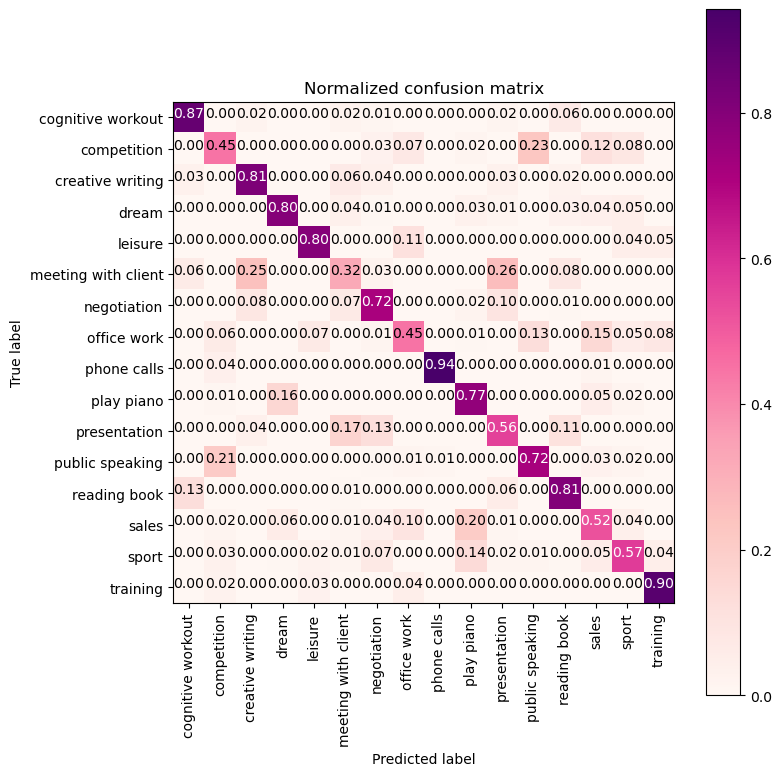

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       0.80      0.87      0.84       611
        competition       0.53      0.45      0.49       602
   creative writing       0.69      0.81      0.75       611
              dream       0.77      0.80      0.78       556
            leisure       0.80      0.80      0.80       362
meeting with client       0.43      0.32      0.37       548
        negotiation       0.66      0.72      0.69       579
        office work       0.61      0.45      0.51       608
        phone calls       0.98      0.94      0.96       621
         play piano       0.65      0.77      0.71       606
       presentation       0.54      0.56      0.55       606
    public speaking       0.67      0.72      0.69       615
       reading book       0.72      0.81      0.76       591
              sales       0.52      0.52      0.52       568
       

In [303]:
# start Grid search
parameters = {'C':[0.01, 0.1, 1, 10, 20, 30], 'penalty':['l2']}
log_reg = linear_model.LogisticRegression(max_iter=1000)
log_reg_grid = GridSearchCV(log_reg, param_grid=parameters, cv=3, verbose=1, n_jobs=-1)
log_reg_grid_results =  perform_model(log_reg_grid, X_train, y_train, X_test, y_test, class_labels=labels)

In [309]:
# observe the attributes of the model 
print_grid_search_attributes(log_reg_grid_results['model'])

--------------------------
|      Best Estimator     |
--------------------------

	LogisticRegression(C=30, max_iter=1000)

--------------------------
|     Best parameters     |
--------------------------
	Parameters of best estimator : 

	{'C': 30, 'penalty': 'l2'}

---------------------------------
|   No of CrossValidation sets   |
--------------------------------

	Total numbre of cross validation sets: 3

--------------------------
|        Best Score       |
--------------------------

	Average Cross Validate scores of best estimator : 

	0.681351547975103



In [315]:
log_reg.coef_[0]

array([-153.63090038,   -1.85839677,   -8.51537423,    0.4928385 ,
          1.91488251,    0.51895884])

In [332]:
# Instantiate the Logistic Regression model with the specified hyperparameters
log_reg = linear_model.LogisticRegression(max_iter=1000, C=30, penalty='l2')

# Fit the Logistic Regression model on the entire training data
log_reg.fit(X_train, y_train)

X_train = pd.DataFrame(X_train)

# Set the column names
X_train.columns = ['ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity']
# Check if the model is a linear model (e.g., Logistic Regression) with coefficients
if hasattr(log_reg, 'coef_'):
    coefficients = log_reg.coef_[0]
    feature_importance_df = pd.DataFrame({'Feature': range(X_train.shape[1]), 'Coefficient': coefficients})
    feature_importance_df['Absolute_Coefficient'] = abs(feature_importance_df['Coefficient'])
    feature_importance_df = feature_importance_df.sort_values(by='Absolute_Coefficient', ascending=False)

column_index_to_name = {idx: col_name for idx, col_name in enumerate(X_train.columns)}

# Map the column indices to column names in 'feature_importance_df'
feature_importance_df['Feature'] = feature_importance_df['Feature'].map(column_index_to_name)

# Display the updated feature importance DataFrame with feature names
print('-------------------------------------')
print('|  Feature Importance (Logistic Regression) |')
print('-------------------------------------')
print(feature_importance_df.head())


-------------------------------------
|  Feature Importance (Logistic Regression) |
-------------------------------------
       Feature  Coefficient  Absolute_Coefficient
0  ImpulseLoad  -153.630900            153.630900
2           HR    -8.515374              8.515374
4      Posture     1.914883              1.914883
1          HRV    -1.858397              1.858397
5     Activity     0.518959              0.518959


In [ ]:
'ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity'

training the model..
Fitting 3 folds for each of 6 candidates, totalling 18 fits
Done 
 

training_time(HH:MM:SS.ms) - 0:03:15.551941


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:00.005998


---------------------
|      Accuracy      |
---------------------

    0.6868197003987498


--------------------
| Confusion Matrix |
--------------------

 [[532   0  13   0   0  12   5   0   0   0  10   0  39   0   0   0]
 [  0 270   0   0   0   1  16  45   0  10   2 137   2  70  49   0]
 [ 18   0 497   0   0  39  22   0   0   0  20   0  15   0   0   0]
 [  0   0   0 443   0  20   3   0   2  18   7   0  15  22  26   0]
 [  0   0   0   0 289   0   0  40   0   0   0   0   0   0  16  17]
 [ 34   0 137   0   0 176  14   0   0   1 142   0  44   0   0   0]
 [  0   2  48   2   0  39 415   0   0  11  56   0   4   2   0   0]
 [  0  37   0   2  41   0   7 271   0   4   0  77   0  90  32  47]
 [  0  25   0   2   0   0   0   0 585   1   0   0   0   8   0   0]
 [  0   6   0  94   0   0   

C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


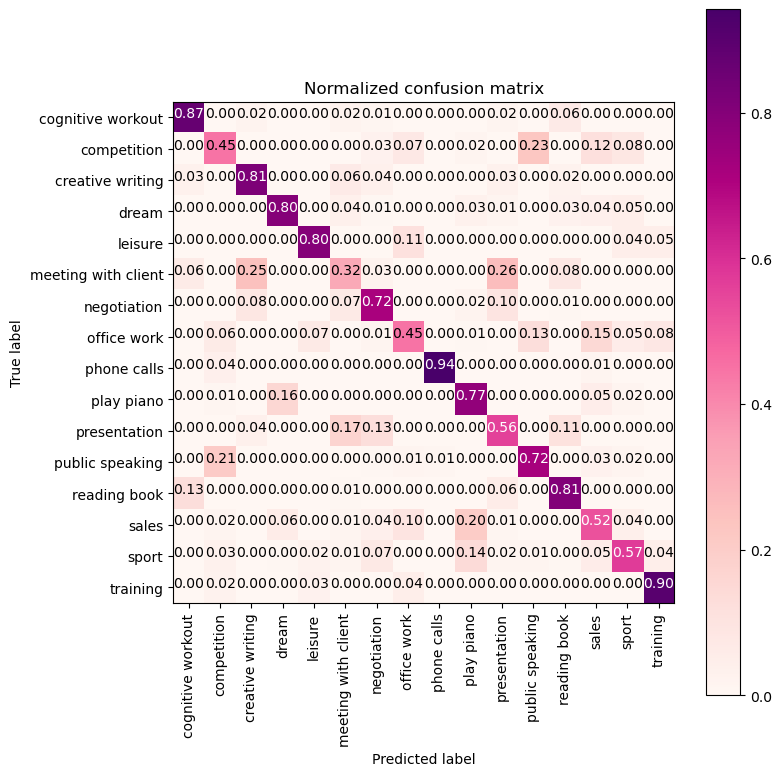

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       0.80      0.87      0.84       611
        competition       0.53      0.45      0.49       602
   creative writing       0.69      0.81      0.75       611
              dream       0.77      0.80      0.78       556
            leisure       0.80      0.80      0.80       362
meeting with client       0.43      0.32      0.37       548
        negotiation       0.66      0.72      0.69       579
        office work       0.61      0.45      0.51       608
        phone calls       0.98      0.94      0.96       621
         play piano       0.65      0.77      0.71       606
       presentation       0.54      0.56      0.55       606
    public speaking       0.67      0.72      0.69       615
       reading book       0.72      0.81      0.76       591
              sales       0.52      0.52      0.52       568
       

In [339]:
# start Grid search
parameters = {'C':[0.01, 0.1, 1, 10, 20, 30], 'penalty':['l2']}
log_reg = linear_model.LogisticRegression(max_iter=1000)
log_reg_grid = GridSearchCV(log_reg, param_grid=parameters, cv=3, verbose=1, n_jobs=-1)
log_reg_grid_results =  perform_model(log_reg_grid, X_train, y_train, X_test, y_test, class_labels=labels)

## SVM / SVC

training the model..
Done 
 

training_time(HH:MM:SS.ms) - 0:34:48.229919


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:40.339287


---------------------
|      Accuracy      |
---------------------

    0.9236986744261235


--------------------
| Confusion Matrix |
--------------------

 [[605   3   0   0   0   1   0   0   0   0   0   0   0   0   2   0]
 [  0 570   0   0   0   0   5  10   0   0   1   2   0   4   9   1]
 [  0   2 568   0   0  25   9   0   0   0   7   0   0   0   0   0]
 [  0   0   0 537   0   0   0   0   0   1   0   0   2   2  14   0]
 [  0   0   0   0 353   0   0   5   0   0   0   0   0   0   4   0]
 [  1   0  27   0   0 455   3   1   0   1  60   0   0   0   0   0]
 [  0   6  23   0   0   9 487   1   0   3  37   2   1   3   7   0]
 [  0   8   0   0   2   0   1 500   0   1   0  28   0  30  23  15]
 [  0   0   0   0   0   0   0   0 616   0   0   0   0   0   5   0]
 [  0   0   0   1   0   0   0   4   0 582   1   0   0  13   5   0]
 [  0   1   9   0   0

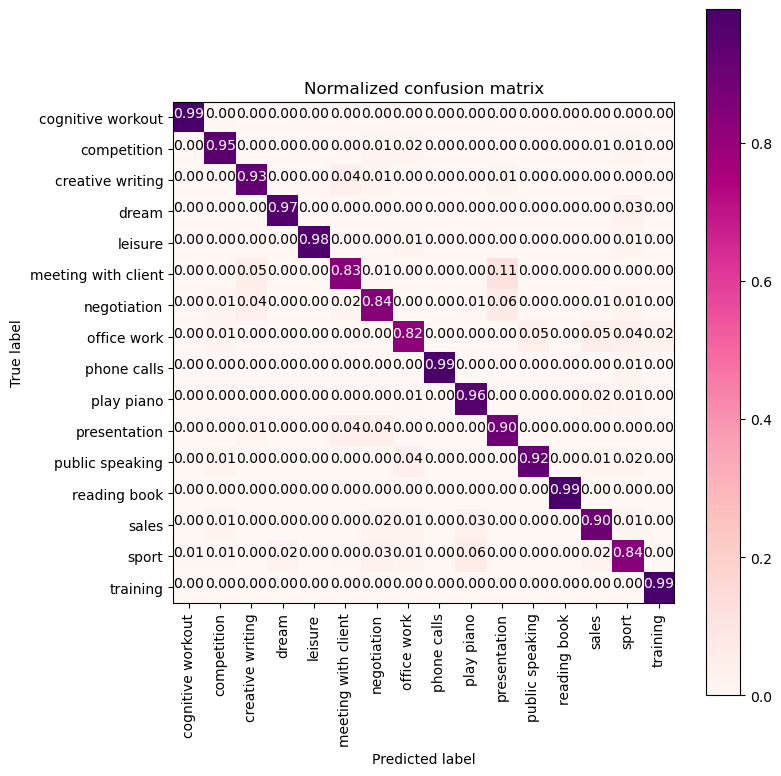

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       0.99      0.99      0.99       611
        competition       0.93      0.95      0.94       602
   creative writing       0.90      0.93      0.92       611
              dream       0.97      0.97      0.97       556
            leisure       0.99      0.98      0.98       362
meeting with client       0.88      0.83      0.85       548
        negotiation       0.87      0.84      0.85       579
        office work       0.89      0.82      0.85       608
        phone calls       1.00      0.99      1.00       621
         play piano       0.91      0.96      0.93       606
       presentation       0.83      0.90      0.86       606
    public speaking       0.94      0.92      0.93       615
       reading book       0.99      0.99      0.99       591
              sales       0.88      0.90      0.89       568
       

In [321]:
from sklearn.svm import SVC
parameters = {'C':[2,8,16],\
              'gamma': [ 0.0078125, 0.125, 2]}
rbf_svm = SVC(kernel='rbf')
rbf_svm_grid = GridSearchCV(rbf_svm,param_grid=parameters, n_jobs=-1)
rbf_svm_grid_results = perform_model(rbf_svm_grid, X_train, y_train, X_test, y_test, class_labels=labels)

In [323]:
print_grid_search_attributes(rbf_svm_grid_results['model'])

--------------------------
|      Best Estimator     |
--------------------------

	SVC(C=16, gamma=2)

--------------------------
|     Best parameters     |
--------------------------
	Parameters of best estimator : 

	{'C': 16, 'gamma': 2}

---------------------------------
|   No of CrossValidation sets   |
--------------------------------

	Total numbre of cross validation sets: 5

--------------------------
|        Best Score       |
--------------------------

	Average Cross Validate scores of best estimator : 

	0.9177645510525323



In [337]:
from sklearn.svm import LinearSVC

training the model..
Fitting 5 folds for each of 1 candidates, totalling 5 fits
Done 
 

training_time(HH:MM:SS.ms) - 0:03:12.062664


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:00.035997


---------------------
|      Accuracy      |
---------------------

    0.5903653410927902


--------------------
| Confusion Matrix |
--------------------

 [[506   2   1  10   0   0   5   0   0   1   5   0  78   0   3   0]
 [  2 173   0   0   0   0  17  34   0  20   2 268   3  13  70   0]
 [ 55   0 430   0   0   9  83   0   0   0  14   0  20   0   0   0]
 [ 32   3  21 406   0   5   2   0   6   9   2   1  21   8  40   0]
 [  0   0   0   1 291   0   0  18   0   0   0   0   0   0   9  43]
 [ 68   0 177   4   0  40  26   0   0  32 134   0  67   0   0   0]
 [  0   9 112   0   0  13 368   0   0   9  23   2  38   5   0   0]
 [  0  35   0   8  54   0   8 131   5  27   0 108   0  52  41 139]
 [  5   5  13   0   0   0   0   0 583   1   4  10   0   0   0   0]
 [  0   6   0 128   0   0   1

C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but LinearSVC was fitted with feature names
  warnings.warn(


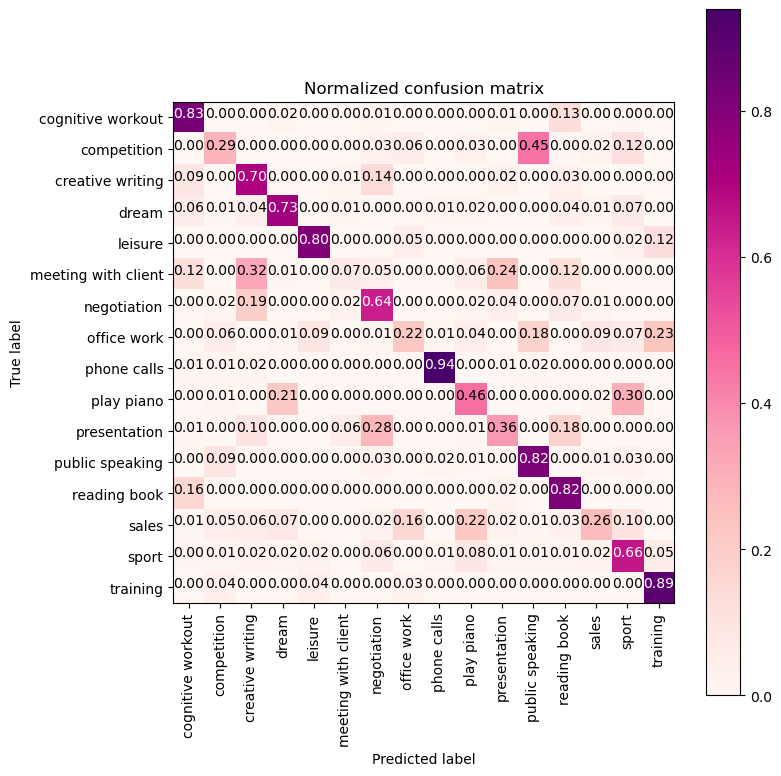

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       0.65      0.83      0.73       611
        competition       0.50      0.29      0.36       602
   creative writing       0.50      0.70      0.59       611
              dream       0.66      0.73      0.70       556
            leisure       0.76      0.80      0.78       362
meeting with client       0.38      0.07      0.12       548
        negotiation       0.49      0.64      0.55       579
        office work       0.45      0.22      0.29       608
        phone calls       0.95      0.94      0.95       621
         play piano       0.50      0.46      0.48       606
       presentation       0.50      0.36      0.42       606
    public speaking       0.56      0.82      0.66       615
       reading book       0.58      0.82      0.67       591
              sales       0.58      0.26      0.36       568
       

In [338]:
#parameters = {'C':[0.125, 0.5, 1, 2, 8, 16]}
parameters = {'C':[0.125]}
lr_svc = LinearSVC(tol=0.00005)
lr_svc_grid = GridSearchCV(lr_svc, param_grid=parameters, n_jobs=-1, verbose=1)
lr_svc_grid_results = perform_model(lr_svc_grid, X_train, y_train, X_test, y_test, class_labels=labels)

Now with all data

In [59]:
X = non_binary_columns[['ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity']]
# X = feature_normalize(X)
y = non_binary_columns['Activities Detailed']

#X_pre_tsne = subdataframe.drop('Activities Detailed', axis=1)
#X_pre_tsne = feature_normalize(X_pre_tsne)
#y_pre_tsne = subdataframe['Activities Detailed']

# Split the data into 80% training and 20% testing
X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train_raw)

X_test = scaler.transform(X_test_raw)

print('X_train and y_train : ({},{})'.format(X_train.shape, y_train.shape))
print('X_test  and y_test  : ({},{})'.format(X_test.shape, y_test.shape))

X_train and y_train : ((214692, 6),(214692,))
X_test  and y_test  : ((53674, 6),(53674,))


In [556]:
X.sample

<bound method NDFrame.sample of                      ImpulseLoad  HRV  HR  BR  Posture  Activity
Time                                                            
2020-03-26 09:02:28          117   45  79  15       16      0.01
2020-03-26 09:02:29          117   45  79  15       16      0.01
2020-03-26 09:02:30          117   45  79  15       17      0.01
2020-03-26 09:02:31          117   45  79  15       17      0.01
2020-03-26 09:02:32          117   45  79  15       17      0.00
...                          ...  ...  ..  ..      ...       ...
2022-06-22 06:35:10          109   38  84  20      -34      0.04
2022-06-22 06:35:11          109   39  84  20      -35      0.01
2022-06-22 06:35:12          109   39  84  19      -36      0.04
2022-06-22 06:35:13          109   40  85  19      -38      0.05
2022-06-22 06:35:14          109   40  85  19      -40      0.06

[268366 rows x 6 columns]>

training the model..
Fitting 3 folds for each of 6 candidates, totalling 18 fits


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Done 
 

training_time(HH:MM:SS.ms) - 0:20:59.233788


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:00.031250


---------------------
|      Accuracy      |
---------------------

    0.7297946864403622


--------------------
| Confusion Matrix |
--------------------

 [[  455     0    33     9     0     7     1     0     0     1     0     0
     58     0     3     0]
 [    0     2     0    19     0     0     8   491     0     0     0    62
      0     0   153    13]
 [   14     0   811    19     0    21    72     0     0     0    14     0
     16     0     0     0]
 [    0     0     0 11933     0     0    65   152     0     1     2     1
    116     0   878     0]
 [    0     0     0     0   229     0     0   107     0     0     0     0
      0     0    11     0]
 [   28     0   166   139     0    58    31     0     0     0    77     0
     11     0    15     0]
 [    0     0   202    54     0    15   873   249     0     0    31     0
      3     0   130     0]
 [   

<Figure size 800x800 with 0 Axes>

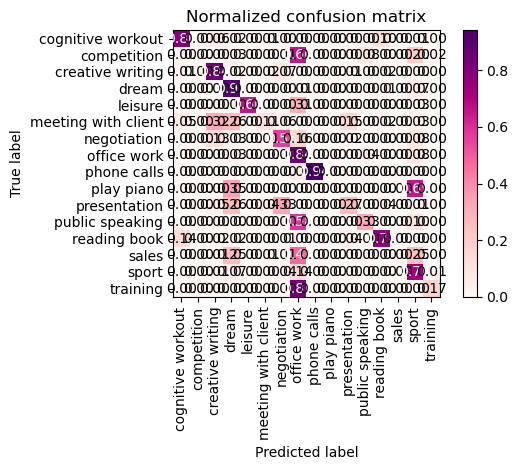

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       0.72      0.80      0.76       567
        competition       0.50      0.00      0.01       748
   creative writing       0.59      0.84      0.70       967
              dream       0.83      0.91      0.87     13148
            leisure       0.93      0.66      0.77       347
meeting with client       0.40      0.11      0.17       525
        negotiation       0.47      0.56      0.51      1557
        office work       0.69      0.84      0.76     14480
        phone calls       1.00      0.94      0.97       829
         play piano       0.00      0.00      0.00       649
       presentation       0.46      0.27      0.34       632
    public speaking       0.51      0.33      0.40      2105
       reading book       0.67      0.78      0.72       647
              sales       0.50      0.00      0.00      1538
       

In [533]:
# start Grid search
parameters = {'C':[0.01, 0.1, 1, 10, 20, 30], 'penalty':['l2']}
log_reg = linear_model.LogisticRegression(max_iter=1000)
log_reg_grid = GridSearchCV(log_reg, param_grid=parameters, cv=3, verbose=1, n_jobs=-1)
log_reg_grid_results =  perform_model(log_reg_grid, X_train, y_train, X_test, y_test, class_labels=labels)

In [534]:
# observe the attributes of the model 
print_grid_search_attributes(log_reg_grid_results['model'])

--------------------------
|      Best Estimator     |
--------------------------

	LogisticRegression(C=30, max_iter=1000)

--------------------------
|     Best parameters     |
--------------------------
	Parameters of best estimator : 

	{'C': 30, 'penalty': 'l2'}

---------------------------------
|   No of CrossValidation sets   |
--------------------------------

	Total numbre of cross validation sets: 3

--------------------------
|        Best Score       |
--------------------------

	Average Cross Validate scores of best estimator : 

	0.7314059210403742



## Decision Tree

training the model..
Done 
 

training_time(HH:MM:SS.ms) - 0:00:20.090735


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:00.006996


---------------------
|      Accuracy      |
---------------------

    0.8835003771958185


--------------------
| Confusion Matrix |
--------------------

 [[609   0   0   0   0   0   2   0   0   0   0   0   0   0   0   0]
 [  0 510   0   0   0   0  25  28   0  11   0   3   0  25   0   0]
 [  0   0 610   0   0   0   0   0   0   0   1   0   0   0   0   0]
 [  0   3   0 456   0   0  18   7   0  29   0   0   0  14  29   0]
 [  0   0   0   0 331   0   0  27   0   0   0   0   0   0   1   3]
 [  0   0   0   0   0 526   0   0   0   0  21   0   0   0   1   0]
 [  2   0   0   0   0   0 572   0   0   0   0   0   0   0   5   0]
 [  0  16   0   6   3   0   3 480   0   4   0  19   0  38   9  30]
 [  0   1   0   0   0   0   0   0 604   5   0   0   0  11   0   0]
 [  0   1   0  17   0   0   0   0   0 537   0   5   0  46   0   0]
 [  1   0   1   0   0

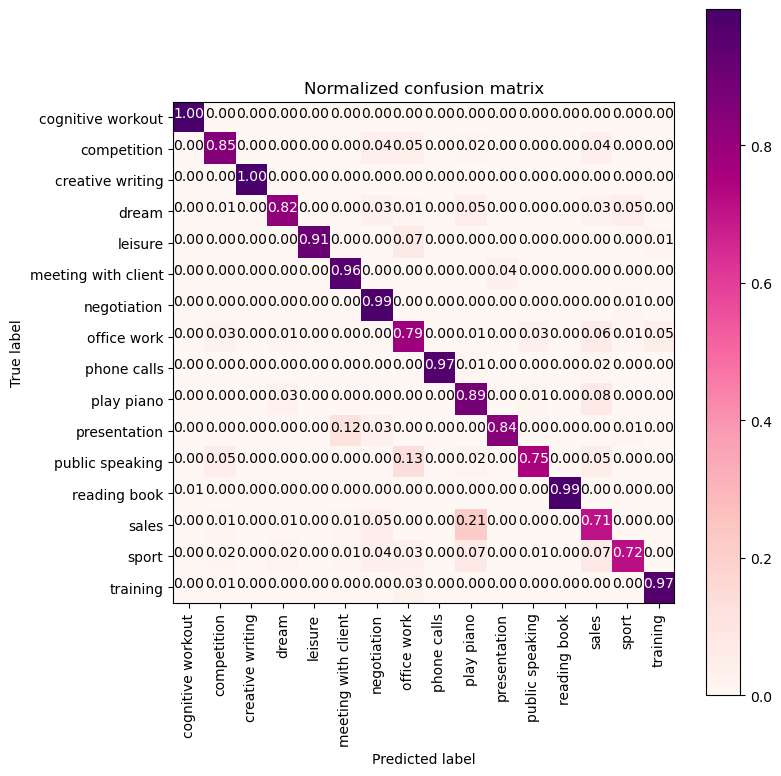

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       0.99      1.00      0.99       611
        competition       0.88      0.85      0.86       602
   creative writing       1.00      1.00      1.00       611
              dream       0.92      0.82      0.87       556
            leisure       0.99      0.91      0.95       362
meeting with client       0.87      0.96      0.91       548
        negotiation       0.82      0.99      0.90       579
        office work       0.73      0.79      0.76       608
        phone calls       1.00      0.97      0.99       621
         play piano       0.70      0.89      0.78       606
       presentation       0.95      0.84      0.89       606
    public speaking       0.94      0.75      0.83       615
       reading book       1.00      0.99      0.99       591
              sales       0.66      0.71      0.68       568
       

In [341]:
from sklearn.tree import DecisionTreeClassifier
parameters = {'max_depth':np.arange(3,10,2)}
dt = DecisionTreeClassifier()
dt_grid = GridSearchCV(dt,param_grid=parameters, n_jobs=-1)
dt_grid_results = perform_model(dt_grid, X_train, y_train, X_test, y_test, class_labels=labels)
print_grid_search_attributes(dt_grid_results['model'])

training the model..
Done 
 

training_time(HH:MM:SS.ms) - 0:13:51.405623


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:00.524040


---------------------
|      Accuracy      |
---------------------

    0.9792003448647484


--------------------
| Confusion Matrix |
--------------------

 [[610   0   0   0   0   0   1   0   0   0   0   0   0   0   0   0]
 [  0 600   0   0   0   0   0   0   0   0   0   1   0   1   0   0]
 [  0   0 610   0   0   0   0   0   0   0   1   0   0   0   0   0]
 [  0   0   0 543   0   0   0   0   0   2   0   1   0   3   7   0]
 [  0   0   0   0 356   0   0   4   0   0   0   0   0   0   1   1]
 [  0   0   0   0   0 544   0   0   0   0   4   0   0   0   0   0]
 [  0   0   0   0   0   0 579   0   0   0   0   0   0   0   0   0]
 [  0  10   0   0   1   1   2 556   0   1   0  18   0   7  10   2]
 [  0   0   0   0   0   0   0   0 621   0   0   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0   0 605   0   0   0   1   0   0]
 [  0   0   0   0   0

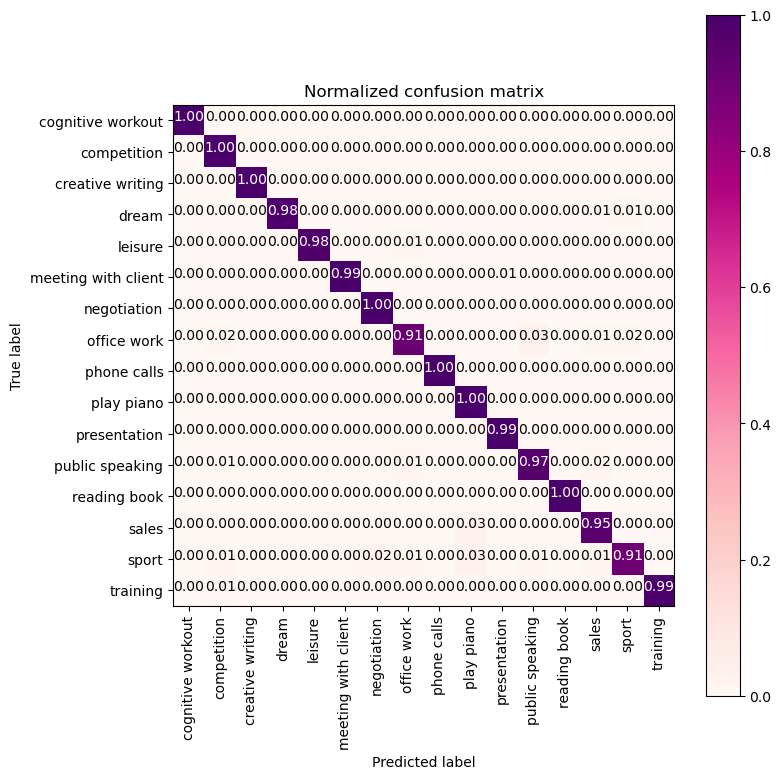

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       1.00      1.00      1.00       611
        competition       0.96      1.00      0.98       602
   creative writing       1.00      1.00      1.00       611
              dream       1.00      0.98      0.99       556
            leisure       1.00      0.98      0.99       362
meeting with client       1.00      0.99      1.00       548
        negotiation       0.96      1.00      0.98       579
        office work       0.97      0.91      0.94       608
        phone calls       1.00      1.00      1.00       621
         play piano       0.94      1.00      0.97       606
       presentation       0.99      0.99      0.99       606
    public speaking       0.96      0.97      0.96       615
       reading book       1.00      1.00      1.00       591
              sales       0.94      0.95      0.95       568
       

In [342]:
from sklearn.ensemble import RandomForestClassifier
params = {'n_estimators': np.arange(10,201,20), 'max_depth':np.arange(3,15,2)}
rfc = RandomForestClassifier()
rfc_grid = GridSearchCV(rfc, param_grid=params, n_jobs=-1)
rfc_grid_results = perform_model(rfc_grid, X_train, y_train, X_test, y_test, class_labels=labels)
print_grid_search_attributes(rfc_grid_results['model'])

## Gradient Boosting

In [62]:
from sklearn.ensemble import GradientBoostingClassifier

In [63]:
# Single set of parameters (max_depth and n_estimators)
max_depth = 5
n_estimators = 130

# Initialize the Gradient Boosting Classifier with the chosen parameters
gbdt = GradientBoostingClassifier(max_depth=max_depth, n_estimators=n_estimators)

training the model..
Done 
 

training_time(HH:MM:SS.ms) - 0:02:37.899222


Predicting test data
Done 
 

testing time(HH:MM:SS:ms) - 0:00:00.575978


---------------------
|      Accuracy      |
---------------------

    0.9916562694946974


--------------------
| Confusion Matrix |
--------------------

 [[ 606    0    0    0    0    0    0    0    0    0    0    0    0    0
     1    0]
 [   0  696    0    0    0    0    0    1    0    0    0    0    0    1
     1    0]
 [   0    0  983    0    0    0    0    0    0    0    0    0    0    0
     0    0]
 [   0    0    0 1018    0    0    1    0    0    2    0    0    0    1
     8    0]
 [   0    0    0    0  348    0    0    0    0    0    0    0    0    0
     1    1]
 [   0    0    0    0    0  510    0    0    0    0    0    0    0    1
     1    0]
 [   0    0    0    0    0    1 1006    0    0    0    0    0    0    0
     0    0]
 [   0    3    0    0    0    0    0  992    0    0    0   17    0    3
     9    1]
 [   0    0

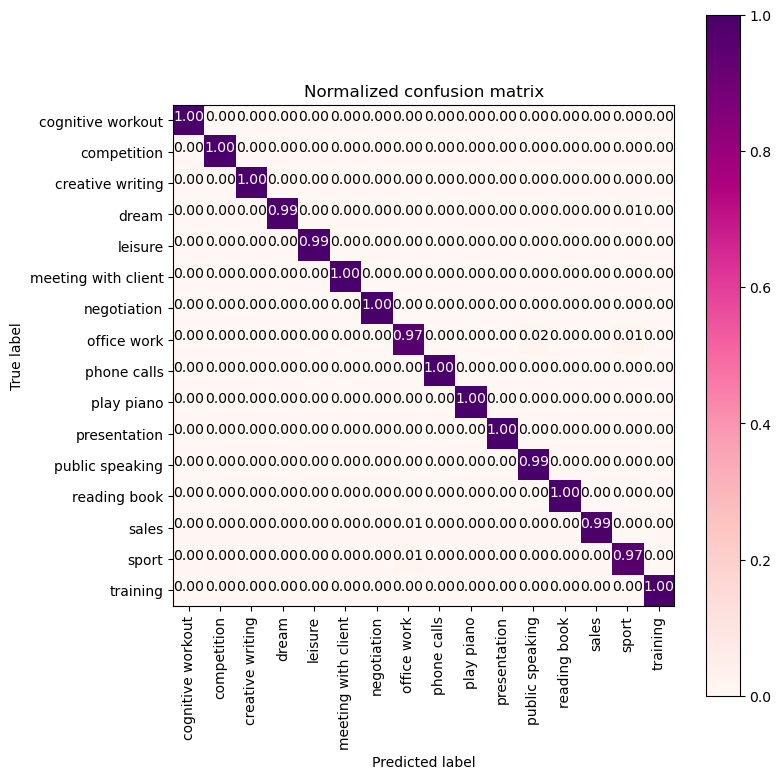

-------------------------
| Classifiction Report |
-------------------------
                     precision    recall  f1-score   support

  cognitive workout       1.00      1.00      1.00       607
        competition       0.98      1.00      0.99       699
   creative writing       1.00      1.00      1.00       983
              dream       1.00      0.99      0.99      1030
            leisure       1.00      0.99      1.00       350
meeting with client       1.00      1.00      1.00       512
        negotiation       1.00      1.00      1.00      1007
        office work       0.98      0.97      0.97      1025
        phone calls       1.00      1.00      1.00       774
         play piano       0.99      1.00      0.99       649
       presentation       1.00      1.00      1.00       705
    public speaking       0.98      0.99      0.99       993
       reading book       1.00      1.00      1.00       635
              sales       0.99      0.99      0.99      1028
       

AttributeError: 'GradientBoostingClassifier' object has no attribute 'best_estimator_'

In [67]:
gbdt_grid_results = perform_model(gbdt, X_train, y_train, X_test, y_test, class_labels=labels)
print_grid_search_attributes(gbdt_grid_results['model'])

## Pipeline. Let's see how good is our model.

### Test with Gradient Boosting

In [68]:
# Features to be used for prediction
feature_cols = ['ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity']

# Create a pipeline with two steps:
# 1. StandardScaler to scale the features
# 2. Trained Gradient Boosting Classifier for prediction
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # The StandardScaler will be fitted on training data
    ('classifier', gbdt)  # Assuming 'gbdt' is the trained GradientBoostingClassifier
])

# Assuming you have a training dataset X_train and y_train
# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Create an empty dictionary to store user input
user_input = {}

# Get user input for each feature
for feature in feature_cols:
    value = float(input(f"Enter the value for {feature}: "))
    user_input[feature] = value

# Convert user input to a DataFrame
unscaled_data = pd.DataFrame([user_input])

# Make predictions on the unscaled data using the pipeline
predicted_labels = pipeline.predict(unscaled_data)

# 'predicted_labels' now contains the predicted label for the user-provided input
print(f"Predicted Label: {predicted_labels[0]}")

Enter the value for ImpulseLoad: 1039
Enter the value for HRV: 101
Enter the value for HR: 117
Enter the value for BR: 20
Enter the value for Posture: 12
Enter the value for Activity: 0.32
Predicted Label: phone calls


C:\Users\david\anaconda3\lib\site-packages\sklearn\base.py:413: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


In [545]:
# Create an empty dictionary to store user input
user_input = {}

# Get user input for each feature
for feature in feature_cols:
    value = float(input(f"Enter the value for {feature}: "))
    user_input[feature] = value

Enter the value for ImpulseLoad: 1039
Enter the value for HRV: 101
Enter the value for HR: 117
Enter the value for BR: 20
Enter the value for Posture: 12
Enter the value for Activity: 0.32


In [69]:
pipeline

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=5, n_estimators=130))])

### Test with Log Reg

In [535]:
# Features to be used for prediction
feature_cols = ['ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity']

# Create a pipeline with two steps:
# 1. StandardScaler to scale the features
# 2. Trained Gradient Boosting Classifier for prediction
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # The StandardScaler will be fitted on training data
    ('classifier', log_reg)  # Assuming 'gbdt' is the trained GradientBoostingClassifier
])

# Assuming you have a training dataset X_train and y_train
# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Create an empty dictionary to store user input
user_input = {}

# Get user input for each feature
for feature in feature_cols:
    value = float(input(f"Enter the value for {feature}: "))
    user_input[feature] = value

# Convert user input to a DataFrame
unscaled_data = pd.DataFrame([user_input])

# Make predictions on the unscaled data using the pipeline
predicted_labels = pipeline.predict(unscaled_data)

# 'predicted_labels' now contains the predicted label for the user-provided input
print(f"Predicted Label: {predicted_labels[0]}")

Enter the value for ImpulseLoad: 109
Enter the value for HRV: 40
Enter the value for HR: 85
Enter the value for BR: 19
Enter the value for Posture: -38
Enter the value for Activity: 0.05
Predicted Label: training


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


In [485]:
# Create an empty dictionary to store user input
user_input = {}

# Get user input for each feature
for feature in feature_cols:
    value = float(input(f"Enter the value for {feature}: "))
    user_input[feature] = value

# Convert user input to a DataFrame
unscaled_data = pd.DataFrame([user_input])

# Make predictions on the unscaled data using the pipeline
predicted_labels = pipeline.predict(unscaled_data)

# 'predicted_labels' now contains the predicted label for the user-provided input
print(f"Predicted Label: {predicted_labels[0]}")

Enter the value for ImpulseLoad: 109
Enter the value for HRV: 40
Enter the value for HR: 85
Enter the value for BR: 19
Enter the value for Posture: -38
Enter the value for Activity: 0.05
Predicted Label: training


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


### Test with Random Forest

In [551]:
rfc

RandomForestClassifier()

In [560]:
#Features to be used for prediction
rfc = RandomForestClassifier(max_depth=13, n_estimators=90)
feature_cols = ['ImpulseLoad', 'HRV', 'HR', 'BR', 'Posture', 'Activity']

# Create a pipeline with two steps:
# 1. StandardScaler to scale the features
# 2. Trained Gradient Boosting Classifier for prediction
pipeline = Pipeline([
    ('scaler', StandardScaler()),  # The StandardScaler will be fitted on training data
    ('classifier', rfc)  # Assuming 'gbdt' is the trained GradientBoostingClassifier
])

# Assuming you have a training dataset X_train and y_train
# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Create an empty dictionary to store user input
user_input = {}

# Get user input for each feature
for feature in feature_cols:
    value = float(input(f"Enter the value for {feature}: "))
    user_input[feature] = value

# Convert user input to a DataFrame
unscaled_data = pd.DataFrame([user_input])

# Make predictions on the unscaled data using the pipeline
predicted_labels = pipeline.predict(unscaled_data)

# 'predicted_labels' now contains the predicted label for the user-provided input
print(f"Predicted Label: {predicted_labels[0]}")

Enter the value for ImpulseLoad: 109
Enter the value for HRV: 40 
Enter the value for HR: 85
Enter the value for BR: 19
Enter the value for Posture: -40
Enter the value for Activity: 0.06
Predicted Label: sport


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


In [554]:
# Create an empty dictionary to store user input
user_input = {}

# Get user input for each feature
for feature in feature_cols:
    value = float(input(f"Enter the value for {feature}: "))
    user_input[feature] = value

# Convert user input to a DataFrame
unscaled_data = pd.DataFrame([user_input])

# Make predictions on the unscaled data using the pipeline
predicted_labels = pipeline.predict(unscaled_data)

# 'predicted_labels' now contains the predicted label for the user-provided input
print(f"Predicted Label: {predicted_labels[0]}")

Enter the value for ImpulseLoad: 117
Enter the value for HRV: 45
Enter the value for HR: 79
Enter the value for BR: 15
Enter the value for Posture: 16
Enter the value for Activity: 0.01
Predicted Label: sport


C:\Users\DavidovB\anaconda3\lib\site-packages\sklearn\base.py:443: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
